# Data Analysis On AMEO Dataset

### Dataset Description

The dataset released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around Target variable Salary and  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. 

## Objective 

The primary objective of this project is to analyze and derive insights from the Aspiring Mind Employment Outcome 2015 (AMEO) dataset, focusing on engineering graduates. The project aims to explore the employment outcomes of these graduates by investigating the relationships between various independent variables, including standardized scores in cognitive skills, technical skills, personality skills, and demographic features.

Some of the goals are:
* Data cleaning and preprocessing
* Data Visualization
* Explore Demographic Features such as Gender, State, City
* Study Employment Outcomes
* Correlation between target and independent features 
* Identify Key Factors


In [27]:
import numpy as np
import pandas as pd

In [28]:
df = pd.read_csv('data.xlsx - Sheet1.csv')
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [29]:
df.shape

(3998, 39)

The data set consist of 3998 rows and 39 columns

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,3998.0,663794.540520,363218.245829,11244.0000,334284.250000,639600.000000,990480.000000,1.298275e+06
Salary,3998.0,307699.849925,212737.499957,35000.0000,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.0000,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.0000,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.0000,66.000000,74.400000,82.600000,9.870000e+01
CollegeID,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
CollegeTier,3998.0,1.925713,0.262270,1.0000,2.000000,2.000000,2.000000,2.000000e+00
collegeGPA,3998.0,71.486171,8.167338,6.4500,66.407500,71.720000,76.327500,9.993000e+01
CollegeCityID,3998.0,5156.851426,4802.261482,2.0000,494.000000,3879.000000,8818.000000,1.840900e+04
CollegeCityTier,3998.0,0.300400,0.458489,0.0000,0.000000,0.000000,1.000000,1.000000e+00


* We can observe that mean of computer science is larger compared to other streams
* We can also observe that average percentage of students is highest in 10th followed by 12th and college


In [32]:
df.columns = df.columns.str.strip()
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [33]:
df.nunique()

Unnamed: 0                  1
ID                       3998
Salary                    177
DOJ                        81
DOL                        67
Designation               419
JobCity                   339
Gender                      2
DOB                      1872
10percentage              851
10board                   275
12graduation               16
12percentage              801
12board                   340
CollegeID                1350
CollegeTier                 2
Degree                      4
Specialization             46
collegeGPA               1282
CollegeCityID            1350
CollegeCityTier             2
CollegeState               26
GraduationYear             11
English                   111
Logical                   107
Quant                     138
Domain                    243
ComputerProgramming        79
ElectronicsAndSemicon      29
ComputerScience            20
MechanicalEngg             42
ElectricalEngg             31
TelecomEngg                26
CivilEngg 

In [34]:
df.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

In [35]:
df.duplicated().value_counts()

False    3998
dtype: int64

In [36]:
def dataoverview(df,message):
    print(f'{message}:\n')
    print('\n No of rows:', df.shape[0])
    print('\n  No of features are:', df.shape[1])
    print("\n Features are:", df.columns.tolist())
    print("\n No of Null values are", df.isnull().sum().values.sum())
    print("\n No of unique features are", df.nunique())
    print("\nDescriptive summary is", df.describe())
    print("\n information about datatypes", df.info())
    print("\n Duplicates:", df.duplicated().value_counts())
dataoverview(df,'Overview of the dataset')

Overview of the dataset:


 No of rows: 3998

  No of features are: 39

 Features are: ['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10percentage', '10board', '12graduation', '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

 No of Null values are 0

 No of unique features are Unnamed: 0                  1
ID                       3998
Salary                    177
DOJ                        81
DOL                        67
Designation               419
JobCity                   339
Gender                      2
DOB                      1872
10percentage             

In [37]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [38]:
df=df.drop(columns=['Unnamed: 0', 'CollegeID','CollegeCityID'],axis=1)
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [39]:
df

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,cbse,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,state board,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,"bse,odisha",...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,947111,200000.0,7/1/14 0:00,1/1/15 0:00,software developer,Asifabadbanglore,f,3/20/92 0:00,78.72,state board,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [40]:
#convert date columns

df['DOJ'] = pd.to_datetime(df['DOJ'])
df['DOB'] = pd.to_datetime(df['DOB'])
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,2014-03-01,3/1/15 0:00,get,Manesar,m,1991-02-27,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [41]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,2014-03-01,3/1/15 0:00,get,Manesar,m,1991-02-27,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [42]:
numerical_cols = df.select_dtypes(include=['float64', 'int64'])
numerical_cols

,ID,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,84.30,2007,95.80,2,78.00,0,2011,515,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,85.40,2007,85.00,2,70.06,0,2012,695,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,85.00,2010,68.20,2,70.00,0,2014,615,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,85.60,2007,83.60,1,74.64,1,2011,635,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,78.00,2008,76.80,2,73.90,0,2012,545,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,52.09,2006,55.50,2,61.50,0,2010,365,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,752781,100000.0,90.00,2009,93.00,2,77.30,1,2013,415,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,355888,320000.0,81.86,2008,65.50,2,70.00,0,2012,475,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,947111,200000.0,78.72,2010,69.88,2,70.42,1,2014,450,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [43]:
categorical_cols = df.select_dtypes(include='object')
categorical_cols

,DOL,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,present,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,present,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,present,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,present,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,3/1/15 0:00,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh
...,...,...,...,...,...,...,...,...,...
3993,10/1/12 0:00,software engineer,New Delhi,m,cbse,cbse,B.Tech/B.E.,information technology,Haryana
3994,7/1/13 0:00,technical writer,Hyderabad,f,state board,state board,B.Tech/B.E.,electronics and communication engineering,Telangana
3995,present,associate software engineer,Bangalore,m,"bse,odisha","chse,odisha",B.Tech/B.E.,computer engineering,Orissa
3996,1/1/15 0:00,software developer,Asifabadbanglore,f,state board,state board,B.Tech/B.E.,computer science & engineering,Karnataka


In [44]:
categorical_cols.value_counts().unique()

array([3, 2, 1], dtype=int64)

In [45]:
def value_counts_for_all_columns(df):
    for column in df.columns:
        print(f"\nColumn: {column}")
        print(df[column].value_counts())
value_counts_for_all_columns(categorical_cols)


Column: DOL
present         1875
4/1/15 0:00      573
3/1/15 0:00      124
5/1/15 0:00      112
1/1/15 0:00       99
                ... 
3/1/05 0:00        1
10/1/15 0:00       1
2/1/10 0:00        1
2/1/11 0:00        1
10/1/10 0:00       1
Name: DOL, Length: 67, dtype: int64

Column: Designation
software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
                                    ... 
cad drafter                            1
noc engineer                           1
human resources intern                 1
senior quality assurance engineer      1
jr. software developer                 1
Name: Designation, Length: 419, dtype: int64

Column: JobCity
Bangalore           627
-1                  461
Noida               368
Hyderabad           335
Pune                290
                   ... 
Tirunelvelli          1
Ernakulam         

In [46]:
value_counts_for_all_columns(numerical_cols)


Column: ID
203097     1
283847     1
1118955    1
327371     1
587792     1
          ..
355018     1
806160     1
102065     1
462964     1
324966     1
Name: ID, Length: 3998, dtype: int64

Column: Salary
300000.0     293
180000.0     239
200000.0     205
325000.0     188
120000.0     165
            ... 
2050000.0      1
144000.0       1
1320000.0      1
755000.0       1
925000.0       1
Name: Salary, Length: 177, dtype: int64

Column: 10percentage
78.00    76
82.00    71
85.00    67
76.00    66
80.00    65
         ..
82.56     1
87.04     1
81.14     1
61.75     1
78.72     1
Name: 10percentage, Length: 851, dtype: int64

Column: 12graduation
2009    1052
2008     935
2010     742
2007     528
2006     407
2005     160
2004      73
2011      46
2003      25
2002      14
2012      10
2001       2
1995       1
1998       1
2013       1
1999       1
Name: 12graduation, dtype: int64

Column: 12percentage
70.00    72
72.00    68
74.00    63
62.00    58
68.00    58
         ..
58.50   

##### There are rows having 0 in 
* 10board,
* 12board 
* and -1 in JobCity columns, which means its nan value

##### There are rows having -1 values in various numerical columns :
* GraduationYear,
* Domain,
* ComputerProgramming,
* ElectronicsAndSemicon,
* ComputerScience,
* MechanicalEngg,
* ElectricalEngg,
* TelecomEngg,
* CivilEngg

In [47]:
df['DOJ'].value_counts()

2014-07-01    199
2014-06-01    180
2014-08-01    178
2014-09-01    142
2014-01-01    142
             ... 
2015-11-01      1
2009-11-01      1
2004-08-01      1
2009-09-01      1
2007-02-01      1
Name: DOJ, Length: 81, dtype: int64

In [48]:
df['DOB'].value_counts()

1991-01-01    11
1991-07-15    10
1991-07-05     8
1991-12-13     8
1991-06-03     8
              ..
1992-12-30     1
1986-10-20     1
1989-11-17     1
1992-09-30     1
1987-04-15     1
Name: DOB, Length: 1872, dtype: int64

##### There are no -1 or 0 values in datetime data type. So lets fix categorical and numerical columns.
We fix by replacing 0 and -1 with np.nan and then imputing by performing mean/median for numerical values and mode for categorical.
mean affects outliers so we go by median

In [49]:
df['10board'] = df['10board'].astype(str).replace('0', np.nan)
df['12board'] = df['12board'].astype(str).replace('0', np.nan)
df['JobCity'] = df['JobCity'].astype(str).replace('-1', np.nan)

In [50]:
df.isnull().sum()

ID                         0
Salary                     0
DOJ                        0
DOL                        0
Designation                0
JobCity                  461
Gender                     0
DOB                        0
10percentage               0
10board                  350
12graduation               0
12percentage               0
12board                  359
CollegeTier                0
Degree                     0
Specialization             0
collegeGPA                 0
CollegeCityTier            0
CollegeState               0
GraduationYear             0
English                    0
Logical                    0
Quant                      0
Domain                     0
ComputerProgramming        0
ElectronicsAndSemicon      0
ComputerScience            0
MechanicalEngg             0
ElectricalEngg             0
TelecomEngg                0
CivilEngg                  0
conscientiousness          0
agreeableness              0
extraversion               0
nueroticism   

In [51]:
#imputing categorical col
df['10board'].fillna(df['10board'].mode().iloc[0], inplace=True)
df['12board'].fillna(df['12board'].mode().iloc[0], inplace=True)
df['JobCity'].fillna(df['JobCity'].mode().iloc[0], inplace=True)


In [54]:
df['10board'] = df['10board'].astype('str')

In [55]:
#imputing numerical cols

df['GraduationYear'].fillna(df['GraduationYear'].median(), inplace=True)
df['Domain'].fillna(df['Domain'].median(), inplace=True)

In [56]:
df['Domain'].value_counts()

-1.000000    246
 0.622643    113
 0.538387    110
 0.486747    106
 0.744758    103
            ... 
 0.999250      1
 0.010995      1
 0.639587      1
 0.031150      1
 0.938588      1
Name: Domain, Length: 243, dtype: int64

In [57]:
print(df['10board'].unique())


['board ofsecondary education,ap' 'cbse' 'state board' 'mp board bhopal'
 'icse' 'karnataka secondary school of examination' 'up'
 'karnataka state education examination board' 'ssc'
 'kerala state technical education' 'bseb'
 'state board of secondary education, andhra pradesh' 'matriculation'
 'gujarat state board' 'karnataka state board' 'wbbse'
 'maharashtra state board' 'icse board' 'up board'
 'board of secondary education(bse) orissa'
 'little jacky matric higher secondary school' 'uttar pradesh board'
 'bsc,orissa' 'mp board' 'upboard' 'matriculation board' 'j & k bord'
 'rbse' 'central board of secondary education' 'pseb' 'jkbose'
 'haryana board of school education,(hbse)' 'metric' 'ms board' 'kseeb'
 'stateboard' 'maticulation' 'karnataka secondory education board'
 'mumbai board' 'sslc' 'kseb' 'board secondary  education' 'matric board'
 'board of secondary education' 'west bengal board of secondary education'
 'jharkhand secondary examination board,ranchi' 'u p board' 'bse

In [58]:
#checking percentage of columns having -1

a = (df==-1).mean()*100
a

ID                        0.000000
Salary                    0.000000
DOJ                       0.000000
DOL                       0.000000
Designation               0.000000
JobCity                   0.000000
Gender                    0.000000
DOB                       0.000000
10percentage              0.000000
10board                   0.000000
12graduation              0.000000
12percentage              0.000000
12board                   0.000000
CollegeTier               0.000000
Degree                    0.000000
Specialization            0.000000
collegeGPA                0.000000
CollegeCityTier           0.000000
CollegeState              0.000000
GraduationYear            0.000000
English                   0.000000
Logical                   0.000000
Quant                     0.000000
Domain                    6.153077
ComputerProgramming      21.710855
ElectronicsAndSemicon    71.385693
ComputerScience          77.438719
MechanicalEngg           94.122061
ElectricalEngg      

We drop the columns whose percentage is greater than 90 and impute the rest with median

In [59]:
# Making Gender column more understandable 

df['Gender'] = df['Gender'].replace({'m':'Male', 'f':'Female'})

In [60]:
df = df.drop(columns=['MechanicalEngg', 'ElectricalEngg', 'CivilEngg','TelecomEngg'])

In [61]:
# Assuming df is your DataFrame
df['ComputerProgramming'].fillna(df['ComputerProgramming'].median(), inplace=True)
df['ElectronicsAndSemicon'].fillna(df['ElectronicsAndSemicon'].median(), inplace=True)
df['ComputerScience'].fillna(df['ComputerScience'].median(), inplace=True)

In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     3998 non-null   int64         
 1   Salary                 3998 non-null   float64       
 2   DOJ                    3998 non-null   datetime64[ns]
 3   DOL                    3998 non-null   object        
 4   Designation            3998 non-null   object        
 5   JobCity                3998 non-null   object        
 6   Gender                 3998 non-null   object        
 7   DOB                    3998 non-null   datetime64[ns]
 8   10percentage           3998 non-null   float64       
 9   10board                3998 non-null   object        
 10  12graduation           3998 non-null   int64         
 11  12percentage           3998 non-null   float64       
 12  12board                3998 non-null   object        
 13  Col

In [63]:
df['Specialization'].value_counts()

electronics and communication engineering      880
computer science & engineering                 744
information technology                         660
computer engineering                           600
computer application                           244
mechanical engineering                         201
electronics and electrical engineering         196
electronics & telecommunications               121
electrical engineering                          82
electronics & instrumentation eng               32
civil engineering                               29
electronics and instrumentation engineering     27
information science engineering                 27
instrumentation and control engineering         20
electronics engineering                         19
biotechnology                                   15
other                                           13
industrial & production engineering             10
applied electronics and instrumentation          9
chemical engineering           

In [64]:
stream={'computer engineering':'CS','electronics and communication engineering':'ECE',
 'information technology':'IT','computer science & engineering':'CS',
 'mechanical engineering':'ME','electronics and electrical engineering':'EEE',
 'computer networking':'CS','biomedical engineering':'Other', 'electronics':'EEE',
 'computer science':'CS'}

df['Specialization'].replace(stream,inplace=True)
df['Specialization'].unique()

array(['CS', 'ECE', 'IT', 'ME', 'EEE', 'electronics & telecommunications',
       'instrumentation and control engineering', 'computer application',
       'electronics and computer engineering', 'electrical engineering',
       'applied electronics and instrumentation',
       'electronics & instrumentation eng',
       'information science engineering', 'civil engineering',
       'mechanical and automation', 'industrial & production engineering',
       'control and instrumentation engineering',
       'metallurgical engineering',
       'electronics and instrumentation engineering',
       'electronics engineering', 'ceramic engineering',
       'chemical engineering', 'aeronautical engineering', 'other',
       'biotechnology', 'embedded systems technology',
       'electrical and power engineering',
       'computer science and technology', 'mechatronics',
       'automobile/automotive engineering', 'polymer technology',
       'mechanical & production engineering',
       'power

##### There are redundant values in specialization, therefore we correct them

In [65]:
unique_cities = df['JobCity'].unique()
print(unique_cities)

['Bangalore' 'Indore' 'Chennai' 'Gurgaon' 'Manesar' 'Hyderabad' 'Banglore'
 'Noida' 'Kolkata' 'Pune' 'mohali' 'Jhansi' 'Delhi' 'Hyderabad '
 'Bangalore ' 'noida' 'delhi' 'Bhubaneswar' 'Navi Mumbai' 'Mumbai'
 'New Delhi' 'Mangalore' 'Rewari' 'Gaziabaad' 'Bhiwadi' 'Mysore' 'Rajkot'
 'Greater Noida' 'Jaipur' 'noida ' 'HYDERABAD' 'mysore' 'THANE'
 'Maharajganj' 'Thiruvananthapuram' 'Punchkula' 'Bhubaneshwar' 'Pune '
 'coimbatore' 'Dhanbad' 'Lucknow' 'Trivandrum' 'kolkata' 'mumbai'
 'Gandhi Nagar' 'Una' 'Daman and Diu' 'chennai' 'GURGOAN' 'vsakhapttnam'
 'pune' 'Nagpur' 'Bhagalpur' 'new delhi - jaisalmer' 'Coimbatore'
 'Ahmedabad' 'Kochi/Cochin' 'Bankura' 'Bengaluru' 'Mysore ' 'Kanpur '
 'jaipur' 'Gurgaon ' 'bangalore' 'CHENNAI' 'Vijayawada' 'Kochi' 'Beawar'
 'Alwar' 'NOIDA' 'Greater noida' 'Siliguri ' 'raipur' 'gurgaon' 'Bhopal'
 'Faridabad' 'Jodhpur' 'udaipur' 'Muzaffarpur' 'Kolkata`' 'Bulandshahar'
 'Haridwar' 'Raigarh' 'Visakhapatnam' 'Jabalpur' 'hyderabad' 'Unnao'
 'KOLKATA' 'Thane' 'A

There are cities with spelling mistakes or with extra space, we clean city names

In [66]:
df['JobCity'] = df['JobCity'].str.strip().str.title()
# Dictionary mapping incorrect city names to correct ones
city_corrections = {
    'Bengluru': 'Bangalore',
    'Banglore': 'Bangalore',
    'Banagalore': 'Bangalore',
    'Bangalore ': 'Bangalore',
    'bangalore': 'Bangalore',
    'BANGALORE': 'Bangalore',
    'Bengaluru': 'Bangalore',
    'Banaglore': 'Banglore',
    
    'Mubai': 'Mumbai',
    'Mumbai ': 'Mumbai',
    'mumbai': 'Mumbai',
    'MUMBAI': 'Mumbai',
    'Navi Mumbai':'Mumbai',
    'Navi Mumbai ':'Mumbai',
    
    'Hyderabad ': 'Hyderabad',
    'HYDERABAD': 'Hyderabad',
    'hyderabad': 'Hyderabad',
    'Hyderabad(Bhadurpally)': 'Hyderabad',
    ' Hyderabad': 'Hyderabad',
    'Hderabad': 'Hyderabad',
    

    'Chennai ': 'Chennai',
    'chennai': 'Chennai',
    'CHENNAI': 'Chennai',
    
    'Noida ': 'Noida',
    'noida': 'Noida',
    'NOIDA': 'Noida',
    'Nouda': 'Noida',
    
    'Delhi ': 'Delhi',
    'delhi': 'Delhi',
    'DELHI': 'Delhi',
    'New Delhi': 'Delhi',
    'new delhi': 'Delhi',
    'New Delhi ': 'Delhi',
    'New Dehli': 'Delhi',

    # Add more corrections as needed, e.g., for Gurgaon, Kolkata, etc.
    'Gurgoan': 'Gurgaon',
    'gurgaon': 'Gurgaon',
    'GURGAON': 'Gurgaon',
    
    'Kolkata ': 'Kolkata',
    'kolkata': 'Kolkata',
    'KOLKATA': 'Kolkata',
    
    'Vizag': 'Visakhapatnam',
    'VIZAG': 'Visakhapatnam',
    'vsakhapttnam': 'Visakhapatnam',
    
    # Other examples:
    'Trivandrum': 'Thiruvananthapuram',
    'TRIVANDRUM': 'Thiruvananthapuram',
    'Guragaon': 'Gurgaon',
    'lucknow': 'Lucknow',
    'LUCKNOW': 'Lucknow'
}

# Apply the corrections
df['JobCity'] = df['JobCity'].replace(city_corrections)


In [67]:
df['JobCity'] = df['JobCity'].str.strip()


In [105]:
#We add a new column as age column 

df['Age'] = 2015 - df['DOB'].dt.year
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Age,EmployeeDuration
0,203097,420000.0,2012-06-01,2015-12-31,senior quality engineer,Bangalore,Female,1990-02-19,84.3,"board ofsecondary education,ap",...,445,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,25,3.6
1,579905,500000.0,2013-09-01,2015-12-31,assistant manager,Indore,Male,1989-10-04,85.4,cbse,...,-1,466,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,26,2.3
2,810601,325000.0,2014-06-01,2015-12-31,systems engineer,Chennai,Female,1992-08-03,85.0,cbse,...,395,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,23,1.6
3,267447,1100000.0,2011-07-01,2015-12-31,senior software engineer,Gurgaon,Male,1989-12-05,85.6,cbse,...,615,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,26,4.5
4,343523,200000.0,2014-03-01,2015-03-01,get,Manesar,Male,1991-02-27,78.0,cbse,...,-1,233,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,24,1.0


### Detecting Outliers

In [106]:
#finding outliers

def iqr(df,col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lb = q1 - 1.5*iqr
    ub = q3 + 1.5 * iqr
    outliers = list(df[(df[col]<lb) | (df[col]> ub)][col])
    print(f'length of {col} column outliers are {col,len(outliers)}')
for col in df.select_dtypes('number').columns:
    print(iqr(df,col))

length of ID column outliers are ('ID', 0)
None
length of Salary column outliers are ('Salary', 109)
None
length of 10percentage column outliers are ('10percentage', 30)
None
length of 12graduation column outliers are ('12graduation', 45)
None
length of 12percentage column outliers are ('12percentage', 1)
None
length of CollegeTier column outliers are ('CollegeTier', 297)
None
length of collegeGPA column outliers are ('collegeGPA', 38)
None
length of CollegeCityTier column outliers are ('CollegeCityTier', 0)
None
length of GraduationYear column outliers are ('GraduationYear', 2)
None
length of English column outliers are ('English', 15)
None
length of Logical column outliers are ('Logical', 18)
None
length of Quant column outliers are ('Quant', 25)
None
length of Domain column outliers are ('Domain', 246)
None
length of ComputerProgramming column outliers are ('ComputerProgramming', 2)
None
length of ElectronicsAndSemicon column outliers are ('ElectronicsAndSemicon', 2)
None
length of 

### Removing Outliers

In [107]:
def remove_outliers(df):
    """
    Removes outliers from all numeric columns in a DataFrame based on the IQR method.
    """
    clean_df = df.copy()  # Make a copy of the original DataFrame
    
    for col in clean_df.select_dtypes('number').columns:
        q1 = clean_df[col].quantile(0.25)
        q3 = clean_df[col].quantile(0.75)
        iqr = q3 - q1
        lb = q1 - 1.5 * iqr  # Lower bound
        ub = q3 + 1.5 * iqr  # Upper bound
        
        # Remove outliers by filtering the DataFrame
        clean_df = clean_df[(clean_df[col] >= lb) & (clean_df[col] <= ub)]
        
        print(f'Removed outliers in {col}')
    
    return clean_df


In [108]:
df_cleaned = remove_outliers(df)


Removed outliers in ID
Removed outliers in Salary
Removed outliers in 10percentage
Removed outliers in 12graduation
Removed outliers in 12percentage
Removed outliers in CollegeTier
Removed outliers in collegeGPA
Removed outliers in CollegeCityTier
Removed outliers in GraduationYear
Removed outliers in English
Removed outliers in Logical
Removed outliers in Quant
Removed outliers in Domain
Removed outliers in ComputerProgramming
Removed outliers in ElectronicsAndSemicon
Removed outliers in ComputerScience
Removed outliers in conscientiousness
Removed outliers in agreeableness
Removed outliers in extraversion
Removed outliers in nueroticism
Removed outliers in openess_to_experience
Removed outliers in Age
Removed outliers in EmployeeDuration


In [109]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,3998.0,663794.540520,363218.245829,11244.0000,334284.250000,639600.000000,990480.000000,1.298275e+06
Salary,3998.0,307699.849925,212737.499957,35000.0000,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.0000,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.0000,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.0000,66.000000,74.400000,82.600000,9.870000e+01
CollegeTier,3998.0,1.925713,0.262270,1.0000,2.000000,2.000000,2.000000,2.000000e+00
collegeGPA,3998.0,71.486171,8.167338,6.4500,66.407500,71.720000,76.327500,9.993000e+01
CollegeCityTier,3998.0,0.300400,0.458489,0.0000,0.000000,0.000000,1.000000,1.000000e+00
GraduationYear,3998.0,2012.105803,31.857271,0.0000,2012.000000,2013.000000,2014.000000,2.017000e+03
English,3998.0,501.649075,104.940021,180.0000,425.000000,500.000000,570.000000,8.750000e+02


In [110]:
df_cleaned.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,1890.0,701907.792593,356497.896432,16037.000000,350633.750000,669030.500000,1.037152e+06,1.298275e+06
Salary,1890.0,279238.095238,121673.966755,35000.000000,180000.000000,300000.000000,3.500000e+05,6.550000e+05
10percentage,1890.0,77.311899,9.726226,50.600000,71.000000,78.000000,8.500000e+01,9.712000e+01
12graduation,1890.0,2008.194709,1.492233,2004.000000,2007.000000,2008.000000,2.009000e+03,2.012000e+03
12percentage,1890.0,73.278624,10.923399,43.000000,65.000000,72.800000,8.125750e+01,9.790000e+01
CollegeTier,1890.0,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000e+00,2.000000e+00
collegeGPA,1890.0,71.589931,6.887699,51.800000,67.000000,71.700000,7.600000e+01,9.010000e+01
CollegeCityTier,1890.0,0.285714,0.451874,0.000000,0.000000,0.000000,1.000000e+00,1.000000e+00
GraduationYear,1890.0,2012.735450,1.218293,2009.000000,2012.000000,2013.000000,2.014000e+03,2.017000e+03
English,1890.0,497.129101,101.775759,205.000000,425.000000,495.000000,5.700000e+02,7.800000e+02


In [111]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Age,EmployeeDuration
0,203097,420000.0,2012-06-01,2015-12-31,senior quality engineer,Bangalore,Female,1990-02-19,84.3,"board ofsecondary education,ap",...,445,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,25,3.6
1,579905,500000.0,2013-09-01,2015-12-31,assistant manager,Indore,Male,1989-10-04,85.4,cbse,...,-1,466,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,26,2.3
2,810601,325000.0,2014-06-01,2015-12-31,systems engineer,Chennai,Female,1992-08-03,85.0,cbse,...,395,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,23,1.6
3,267447,1100000.0,2011-07-01,2015-12-31,senior software engineer,Gurgaon,Male,1989-12-05,85.6,cbse,...,615,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,26,4.5
4,343523,200000.0,2014-03-01,2015-03-01,get,Manesar,Male,1991-02-27,78.0,cbse,...,-1,233,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,24,1.0


In [75]:
df['DOL'] =  df['DOL'].replace('present', '2015-12-31 00:00:00')
df['DOL'] = pd.to_datetime(df['DOL'], errors='coerce')
df['DOJ'] = pd.to_datetime(df['DOJ'], errors='coerce')

In [76]:
df['EmployeeDuration'] = round((df['DOL'] - df['DOJ']).dt.days/365.25,1)
df['EmployeeDuration'] 

0       3.6
1       2.3
2       1.6
3       4.5
4       1.0
       ... 
3993    1.0
3994    0.0
3995    2.5
3996    0.5
3997    2.9
Name: EmployeeDuration, Length: 3998, dtype: float64

## Univariate Analysis Of Categorical Columns

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns

In [78]:
categorical_cols.columns

Index(['DOL', 'Designation', 'JobCity', 'Gender', '10board', '12board',
       'Degree', 'Specialization', 'CollegeState'],
      dtype='object')

#### Univariate on Designation column

In [79]:
categorical_cols['Designation'].value_counts().head(10)

software engineer             539
software developer            265
system engineer               205
programmer analyst            139
systems engineer              118
java software engineer        111
software test engineer        100
project engineer               77
technical support engineer     76
senior software engineer       72
Name: Designation, dtype: int64

<AxesSubplot:xlabel='count', ylabel='Designation'>

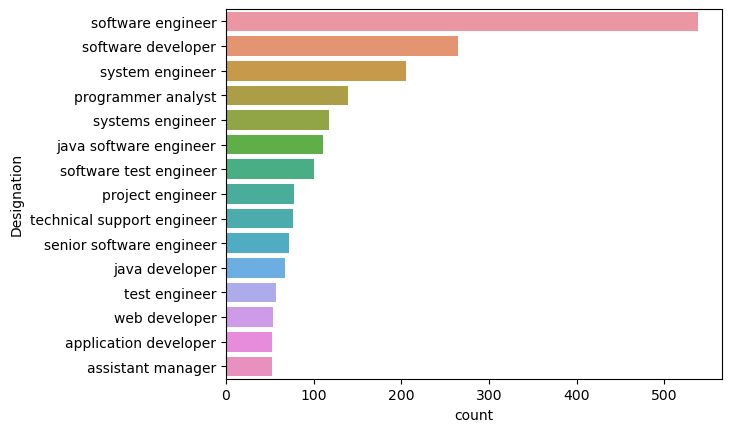

In [80]:
sns.countplot(y='Designation', data=categorical_cols, order= categorical_cols['Designation'].value_counts().iloc[:15].index)

From the above count we can observe that Top 3 Designations are 1. Software Engineer 2. Software developer, 3. System Engineer followed by others

Univariate on JobCity column

<AxesSubplot:title={'center':'City Count'}>

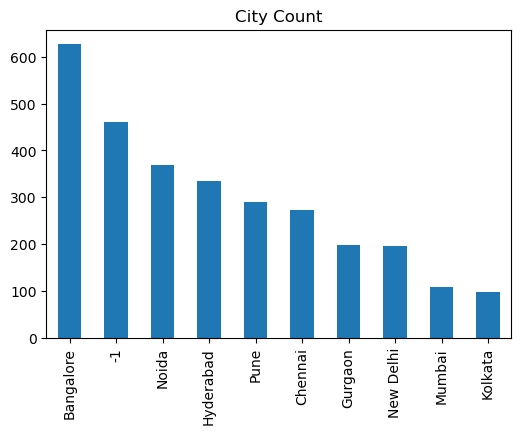

In [81]:
categorical_cols['JobCity'].value_counts().head(10).plot(kind='bar', title= 'City Count',figsize=(6,4))

Top most city with the maximum number of jobs is Banglore, followed by Noida, Hyderabad, Pune and Chennai.

#### Univariate on Gender column

<AxesSubplot:ylabel='Gender'>

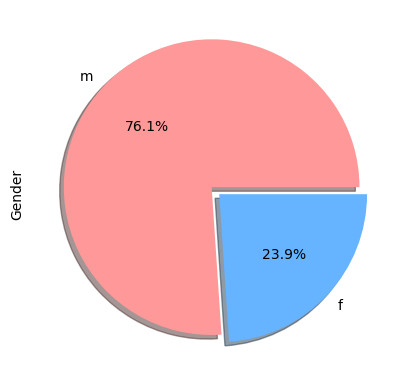

In [82]:
categorical_cols['Gender'].value_counts().plot(kind='pie', autopct ='%1.1f%%', startangle=0, explode=(0.07,0), shadow=True, colors = ['#ff9999','#66b3ff','#ff9999','#99ff99','#ffcc99'])

Percentage of Male is much much higher than Female which is 76.1%

In [83]:
df['10board'].value_counts()

cbse                          1745
state board                   1164
icse                           281
ssc                            122
up board                        85
                              ... 
hse,orissa                       1
national public school           1
nagpur board                     1
jharkhand academic council       1
bse,odisha                       1
Name: 10board, Length: 274, dtype: int64

#### Univariate analysis on 10board and 12board

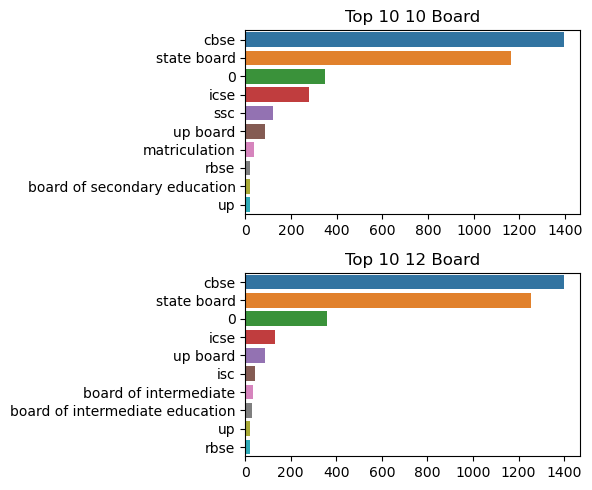

In [84]:

# Get the top 10 most common values for '10board' and '12board' columns
top_10_10board = categorical_cols['10board'].value_counts().head(10)
top_10_12board = categorical_cols['12board'].value_counts().head(10)

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,5))

# Subplot for the top 10 values in '10board'
sns.barplot(y=top_10_10board.index, x=top_10_10board.values, ax=axes[0], orient='h')
axes[0].set_title('Top 10 10 Board')

# Subplot for the top 10 values in '12board'
sns.barplot(y=top_10_12board.index, x=top_10_12board.values, ax=axes[1], orient='h')
axes[1].set_title('Top 10 12 Board')

plt.tight_layout()
plt.show()


Top board opted by students is CBSE, State board and icse in both 10th and 12th. Most students are from CBSE Board

#### Degree 

B.Tech/B.E.      3700
MCA               243
M.Tech./M.E.       53
M.Sc. (Tech.)       2
Name: Degree, dtype: int64


<AxesSubplot:>

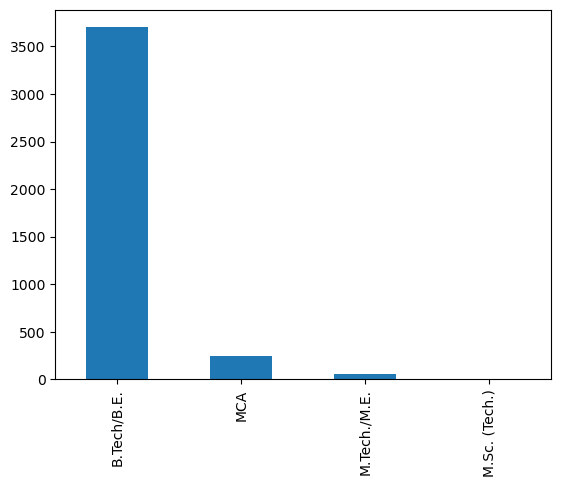

In [85]:
print(categorical_cols['Degree'].value_counts())
categorical_cols['Degree'].value_counts().plot(kind='bar')

Majority of the students are Btech/BE Graduates. Less students have done their masters

#### Specialization

In [86]:
df['Specialization'].value_counts()

CS                                             1347
ECE                                             880
IT                                              660
computer application                            244
ME                                              201
EEE                                             197
electronics & telecommunications                121
electrical engineering                           82
electronics & instrumentation eng                32
civil engineering                                29
electronics and instrumentation engineering      27
information science engineering                  27
instrumentation and control engineering          20
electronics engineering                          19
biotechnology                                    15
other                                            13
industrial & production engineering              10
chemical engineering                              9
applied electronics and instrumentation           9
telecommunic

<AxesSubplot:>

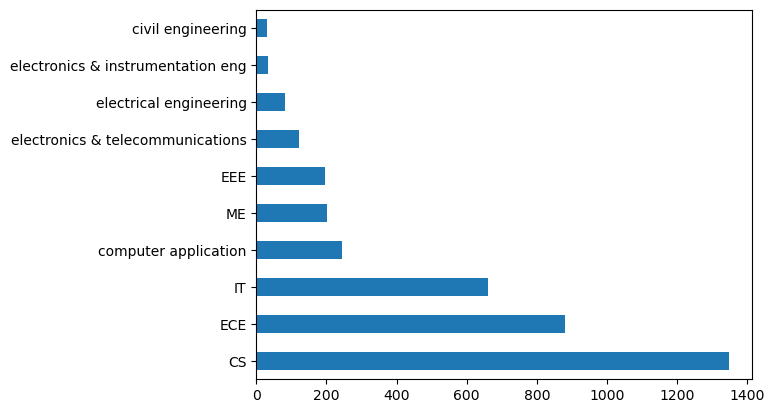

In [87]:
df['Specialization'].value_counts().head(10).plot(kind='barh')


Majority of the students have done their graduation in CS followed by ECE and IT. and Least students are from Electronics and Instrumentation 

#### College State

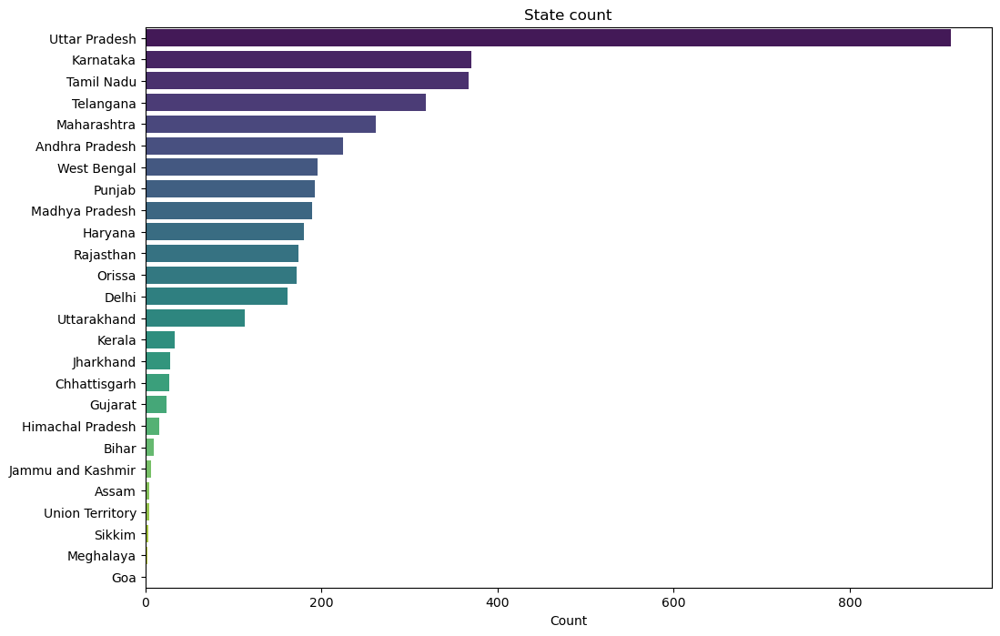

In [88]:
state_counts = categorical_cols['CollegeState'].value_counts()
plt.figure(figsize=(12, 8))
sns.barplot(x=state_counts.values, y=state_counts.index, palette='viridis')
plt.xlabel('Count')
plt.title('State count')
plt.show()

Majority of the students have studied from UP, followed by karnataka, tamil nadu and telangana and least are from Goa

### Univariate Analysis on Date Range Columns

In [89]:
# Earliest and latest dates for DOJ
earliest_doj = df['DOJ'].min()
latest_doj = df['DOJ'].max()

# Earliest and latest dates for DOL
earliest_dol = df['DOL'].min()
latest_dol = df['DOL'].max()

# Print results
print(f"Earliest DOJ: {earliest_doj}")
print(f"Latest DOJ: {latest_doj}")
print(f"Earliest DOL: {earliest_dol}")
print(f"Latest DOL: {latest_dol}")

Earliest DOJ: 1991-06-01 00:00:00
Latest DOJ: 2015-12-01 00:00:00
Earliest DOL: 2005-03-01 00:00:00
Latest DOL: 2015-12-31 00:00:00


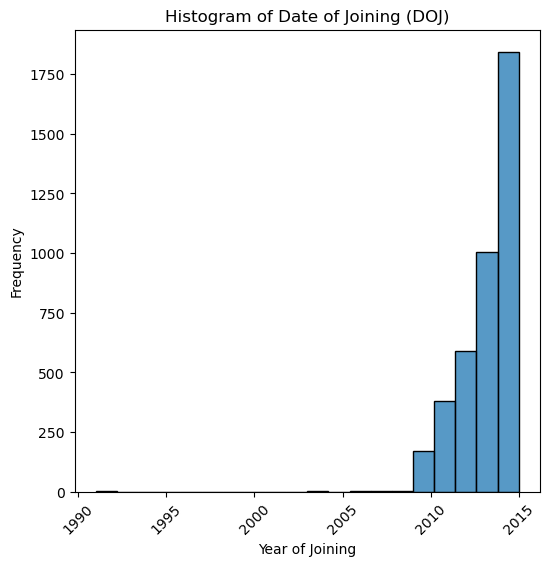

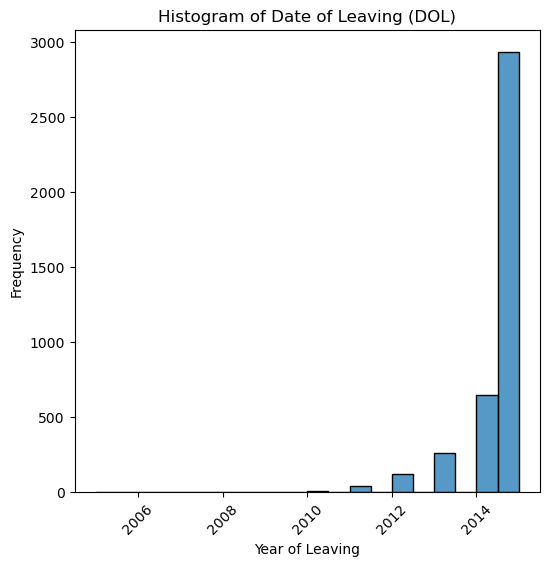

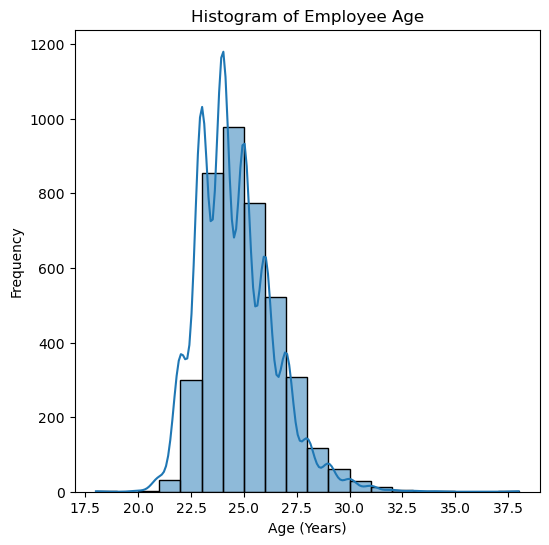

In [90]:
# Histogram for DOJ (Date of Joining)
plt.figure(figsize=(6, 6))
sns.histplot(df['DOJ'].dt.year, bins=20, kde=False)
plt.title('Histogram of Date of Joining (DOJ)')
plt.xlabel('Year of Joining')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Histogram for DOL (Date of Leaving)
plt.figure(figsize=(6, 6))
sns.histplot(df['DOL'].dropna().dt.year, bins=20, kde=False)
plt.title('Histogram of Date of Leaving (DOL)')
plt.xlabel('Year of Leaving')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Histogram for Age Distribution
plt.figure(figsize=(6, 6))
sns.histplot(df['Age'], bins=20, kde=True)
plt.title('Histogram of Employee Age')
plt.xlabel('Age (Years)')
plt.ylabel('Frequency')
plt.show()


* We can observe that majority of the employees have joined the company in the year 2015 and 
* majority of the employees has left the company in the same year 2015 
* Majority of the employees are aged between 32 to 35 years

#### Univariate Analysis on Numerical Column

In [91]:
df['Salary'].describe()

count    3.998000e+03
mean     3.076998e+05
std      2.127375e+05
min      3.500000e+04
25%      1.800000e+05
50%      3.000000e+05
75%      3.700000e+05
max      4.000000e+06
Name: Salary, dtype: float64

<AxesSubplot:>

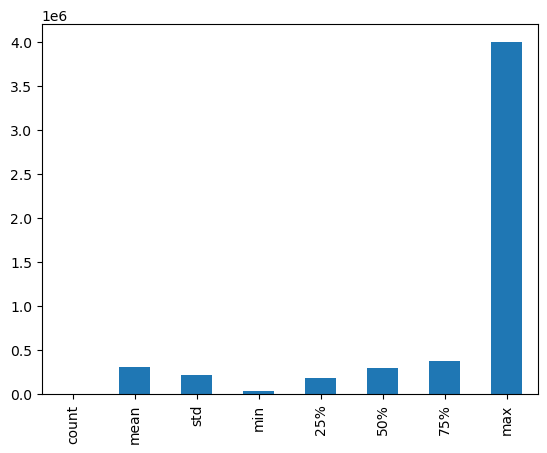

In [92]:
df['Salary'].describe().plot(kind='bar')

In [93]:
numerical_cols.head()

,ID,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,84.3,2007,95.8,2,78.00,0,2011,515,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,85.4,2007,85.0,2,70.06,0,2012,695,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,85.0,2010,68.2,2,70.00,0,2014,615,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,85.6,2007,83.6,1,74.64,1,2011,635,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,78.0,2008,76.8,2,73.90,0,2012,545,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [94]:
numerical_cols.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,3998.0,663794.540520,363218.245829,11244.0000,334284.250000,639600.000000,990480.000000,1.298275e+06
Salary,3998.0,307699.849925,212737.499957,35000.0000,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.0000,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.0000,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.0000,66.000000,74.400000,82.600000,9.870000e+01
CollegeTier,3998.0,1.925713,0.262270,1.0000,2.000000,2.000000,2.000000,2.000000e+00
collegeGPA,3998.0,71.486171,8.167338,6.4500,66.407500,71.720000,76.327500,9.993000e+01
CollegeCityTier,3998.0,0.300400,0.458489,0.0000,0.000000,0.000000,1.000000,1.000000e+00
GraduationYear,3998.0,2012.105803,31.857271,0.0000,2012.000000,2013.000000,2014.000000,2.017000e+03
English,3998.0,501.649075,104.940021,180.0000,425.000000,500.000000,570.000000,8.750000e+02


### plot on cleaned data

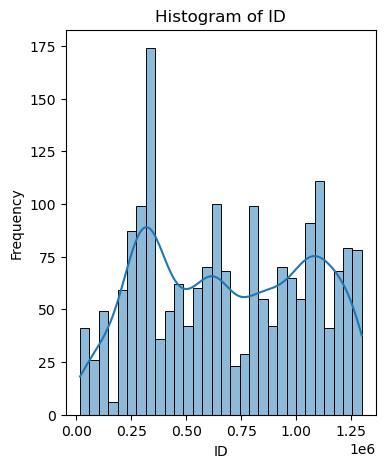

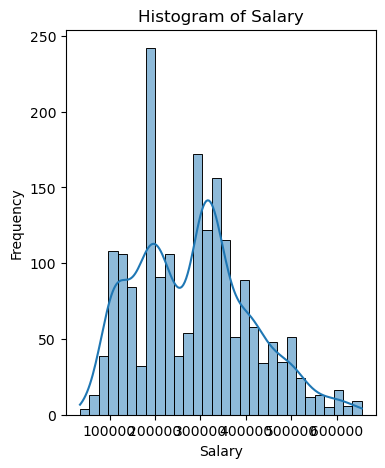

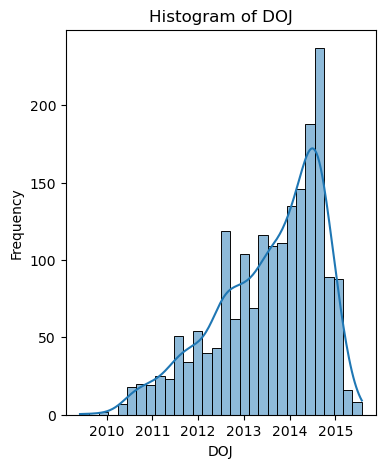

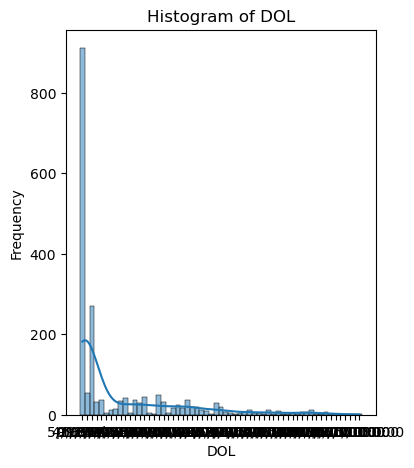

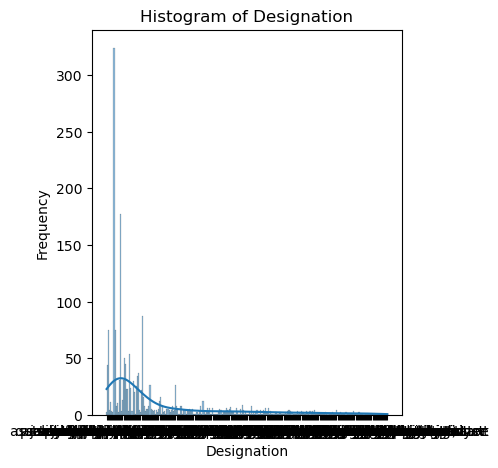

...

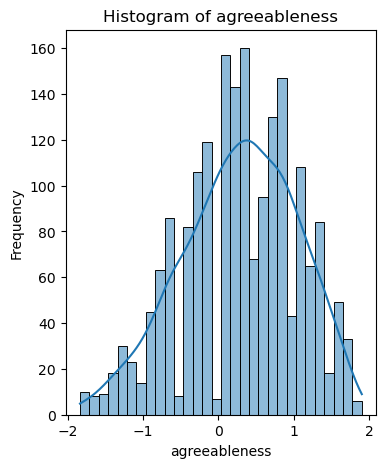

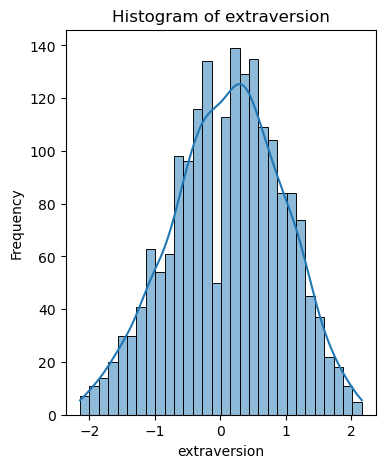

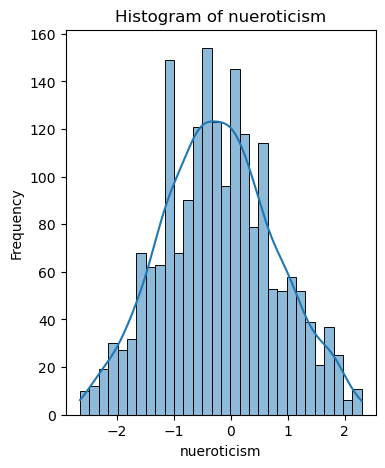

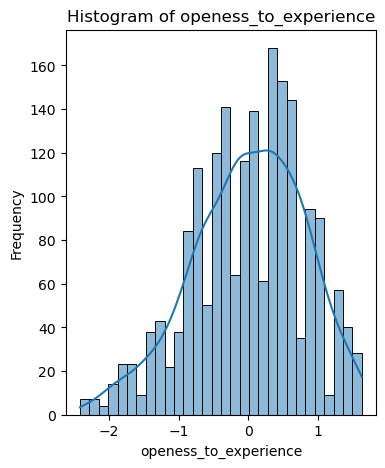

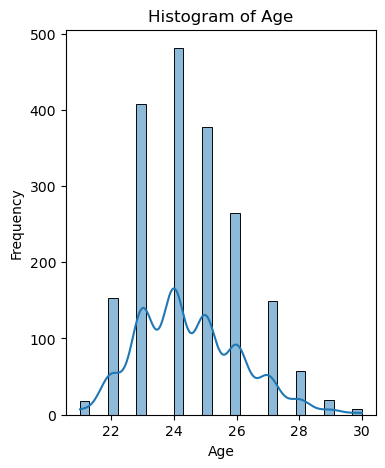

In [95]:
for col in df_cleaned:
    plt.figure(figsize=(4, 5))
    sns.histplot(df_cleaned[col], kde=True, bins=30)  # kde=True adds a smooth density estimate line
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

### Univariate analysis on Salary

In [96]:
numerical_cols['Salary'].describe()

count    3.998000e+03
mean     3.076998e+05
std      2.127375e+05
min      3.500000e+04
25%      1.800000e+05
50%      3.000000e+05
75%      3.700000e+05
max      4.000000e+06
Name: Salary, dtype: float64

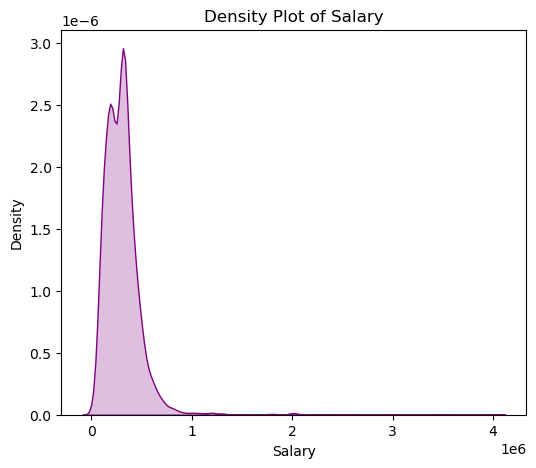

In [97]:
plt.figure(figsize=(6, 5))
sns.kdeplot(df['Salary'], shade=True, color='purple')
plt.title('Density Plot of Salary')
plt.xlabel('Salary')
plt.ylabel('Density')
plt.show()


### After Removing Outliers

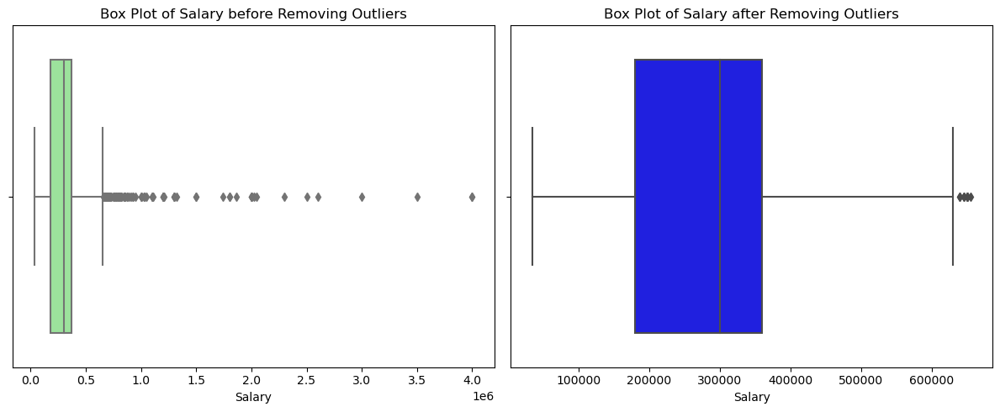

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure for the subplots
plt.figure(figsize=(12, 5))

# First subplot for Salary before removing outliers
plt.subplot(1, 2, 1)
sns.boxplot(x=df['Salary'], color='lightgreen')
plt.title('Box Plot of Salary before Removing Outliers')
plt.xlabel('Salary')

# Second subplot for Salary after removing outliers
plt.subplot(1, 2, 2)
sns.boxplot(x=df_cleaned['Salary'], color='b')
plt.title('Box Plot of Salary after Removing Outliers')
plt.xlabel('Salary')

# Display both subplots
plt.tight_layout()
plt.show()



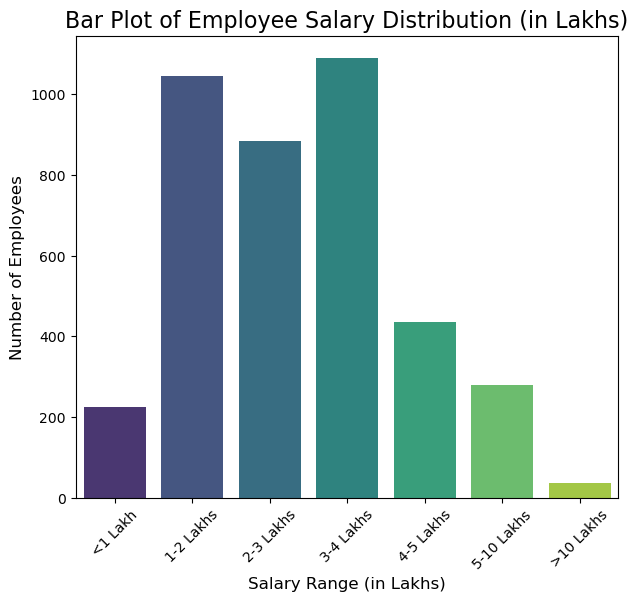

In [99]:

import matplotlib.pyplot as plt
import seaborn as sns

# Create salary bins with ranges in lakhs
salary_bins = pd.cut(df['Salary'], bins=[0, 100000, 200000, 300000, 400000, 500000, 1000000, 4000000], 
                     labels=['<1 Lakh', '1-2 Lakhs', '2-3 Lakhs', '3-4 Lakhs', '4-5 Lakhs', '5-10 Lakhs', '>10 Lakhs'])

# Count the number of employees in each salary bin
salary_counts = salary_bins.value_counts().sort_index()

# Plot the bar plot
plt.figure(figsize=(7, 6))
sns.barplot(x=salary_counts.index, y=salary_counts.values, palette='viridis')

# Set plot labels and title
plt.title('Bar Plot of Employee Salary Distribution (in Lakhs)', fontsize=16)
plt.xlabel('Salary Range (in Lakhs)', fontsize=12)
plt.ylabel('Number of Employees', fontsize=12)

# Display the plot
plt.xticks(rotation=45)
plt.show()


Observartions:

* We can observe that there is wide range of deviation from mean, which means salary distribution is not uniform.
* There are few outliers too whose salary is maximum, which effects the mean
* Histogram and density plot is rightly skewed which means most employees earn lower salaries

In [100]:
df_cleaned['Salary'].describe()

count      1934.000000
mean     284012.409514
std      125085.720638
min       35000.000000
25%      180000.000000
50%      300000.000000
75%      360000.000000
max      655000.000000
Name: Salary, dtype: float64

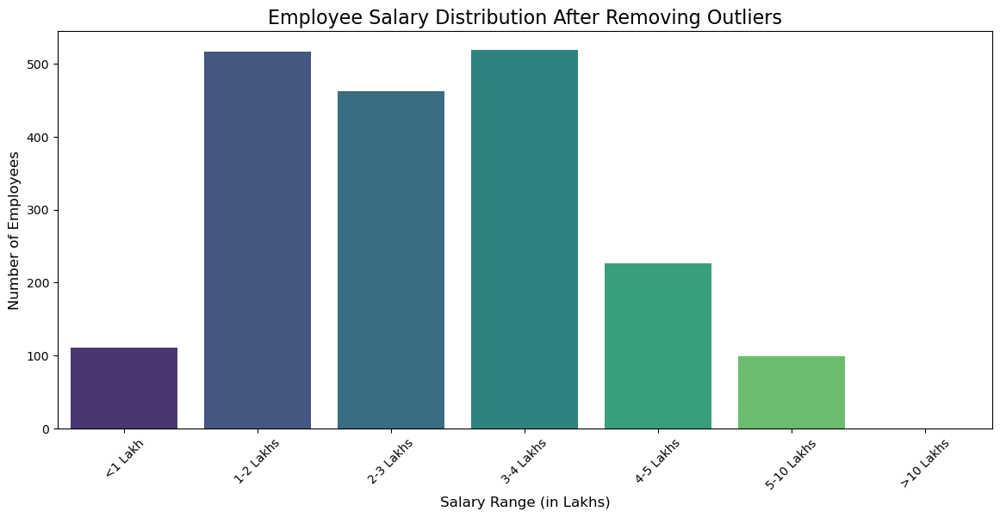

In [101]:


# Create salary bins for the cleaned DataFrame
salary_bins_cleaned = pd.cut(df_cleaned['Salary'], 
                              bins=[0, 100000, 200000, 300000, 400000, 500000, 1000000, 4000000], 
                              labels=['<1 Lakh', '1-2 Lakhs', '2-3 Lakhs', '3-4 Lakhs', 
                                      '4-5 Lakhs', '5-10 Lakhs', '>10 Lakhs'])

# Count the number of employees in each salary bin for the cleaned DataFrame
salary_counts_cleaned = salary_bins_cleaned.value_counts().sort_index()

# Create a figure for the subplots
plt.figure(figsize=(14, 6))
sns.barplot(x=salary_counts_cleaned.index, y=salary_counts_cleaned.values, palette='viridis')
plt.title('Employee Salary Distribution After Removing Outliers', fontsize=16)
plt.xlabel('Salary Range (in Lakhs)', fontsize=12)
plt.ylabel('Number of Employees', fontsize=12)
plt.xticks(rotation=45)


plt.show()


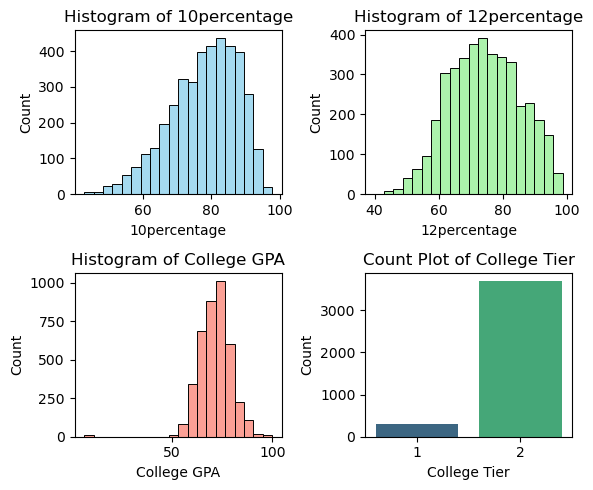

In [102]:
#histogram of 10percentage
plt.figure(figsize=(6, 5))
plt.subplot(2,2,1)
sns.histplot(numerical_cols['10percentage'], bins=20,kde=False,color='skyblue')
plt.title('Histogram of 10percentage')
plt.xlabel('10percentage')
plt.ylabel('Count')

#for  12percentage
plt.subplot(2, 2, 2)
sns.histplot(numerical_cols['12percentage'], bins=20, kde=False, color='lightgreen')
plt.title('Histogram of 12percentage')
plt.xlabel('12percentage')
plt.ylabel('Count')

#for college GPA

plt.subplot(2, 2, 3)
sns.histplot(numerical_cols['collegeGPA'], bins=20, kde=False, color='salmon')
plt.title('Histogram of College GPA')
plt.xlabel('College GPA')
plt.ylabel('Count')

#for collegeTier

plt.subplot(2, 2, 4)
sns.countplot(x='CollegeTier', data=numerical_cols, palette='viridis')
plt.title('Count Plot of College Tier')
plt.xlabel('College Tier')
plt.ylabel('Count')

# Display the plots
plt.tight_layout()
plt.show()

* We observe that most students are from tier 2 college
* candidates have good 10 percentage
* College GPA has normal distribution around mean gpa

Analysis on Age and Employee duration column

Text(0.5, 0, 'Employee Duration (in years)')

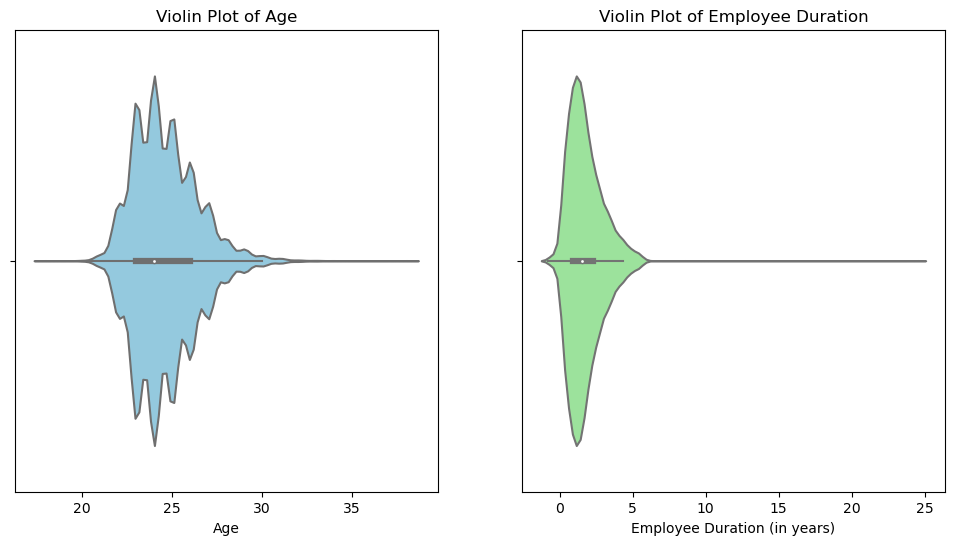

In [103]:
plt.figure(figsize=(12, 6))

    # Violin Plot for Age
plt.subplot(1, 2, 1)
sns.violinplot(x=df['Age'], color='skyblue')
plt.title('Violin Plot of Age')
plt.xlabel('Age')

# Violin Plot for Employee Duration
plt.subplot(1, 2, 2)
sns.violinplot(x=df['EmployeeDuration'], color='lightgreen')
plt.title('Violin Plot of Employee Duration')
plt.xlabel('Employee Duration (in years)')


We observe that most employees range from 20 to 35 years, majority of candidates are betwen 22 and 25 years.
and experience range from 0 to 5 years and mean being 1 years

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


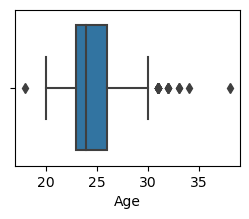

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


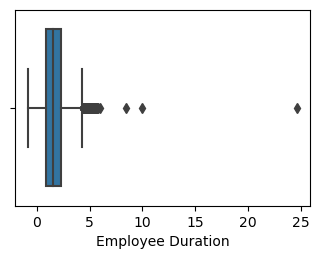

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


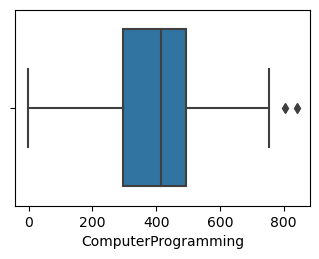

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


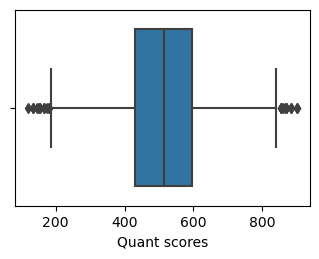

In [114]:
plt.figure(figsize=(5,4))
plt.subplot(2,2,1)
sns.boxplot(df['Age'])
plt.xlabel('Age')
plt.tight_layout()
plt.show()

plt.subplot(2,2,2)
sns.boxplot(df['EmployeeDuration'])
plt.xlabel('Employee Duration')
plt.tight_layout()
plt.show()

plt.subplot(2,2,3)
sns.boxplot(numerical_cols['ComputerProgramming'])
plt.xlabel('ComputerProgramming')
plt.tight_layout()
plt.show()

plt.subplot(2,2,4)
sns.boxplot(numerical_cols['Quant'])
plt.xlabel('Quant scores')
plt.tight_layout()
plt.show()



* We observe that 4 employees are of older age than others and 1 employee is younger than others
* 1 employee has 25 years of experience and few employees have more than 5 years of experience
* There are employees who has scores less than 200 as well as greater than 800, majority of the candidates has scored 4oo to 800 in Quants

## Bivariate Analysis

## Salary vs Categorical columns

### Gender vs Salary

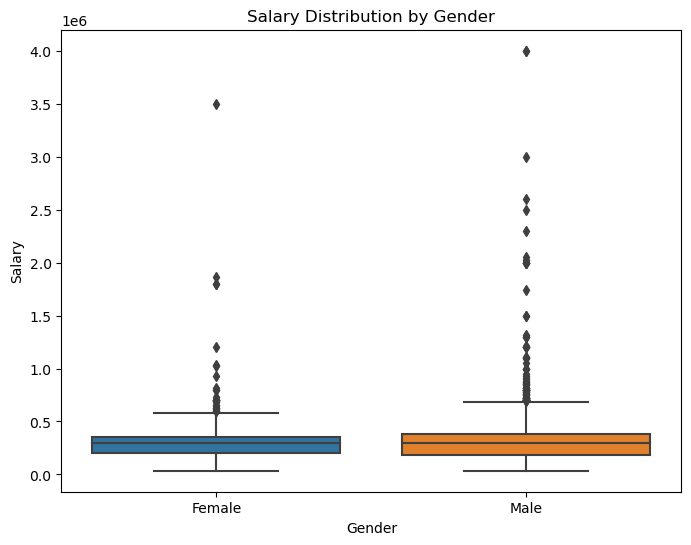

In [115]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Gender', y='Salary', data=df)
plt.title('Salary Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Salary')
plt.show()

* Median of Salary is almost same for the genders
* There are many outliers in men, means Men have highest salary compared to females

In [116]:
df[['10percentage', '12percentage', 'collegeGPA', 'Gender']].groupby('Gender').mean()

,10percentage,12percentage,collegeGPA
Gender,,,
Female,80.932894,77.007618,74.048056
Male,76.979000,73.666636,70.679947


## Designation vs Gender

In [119]:
top_20_designation = df['Designation'].value_counts()[:20].index.tolist()
top_20_designations = df[df['Designation'].isin(top_20_designation)]

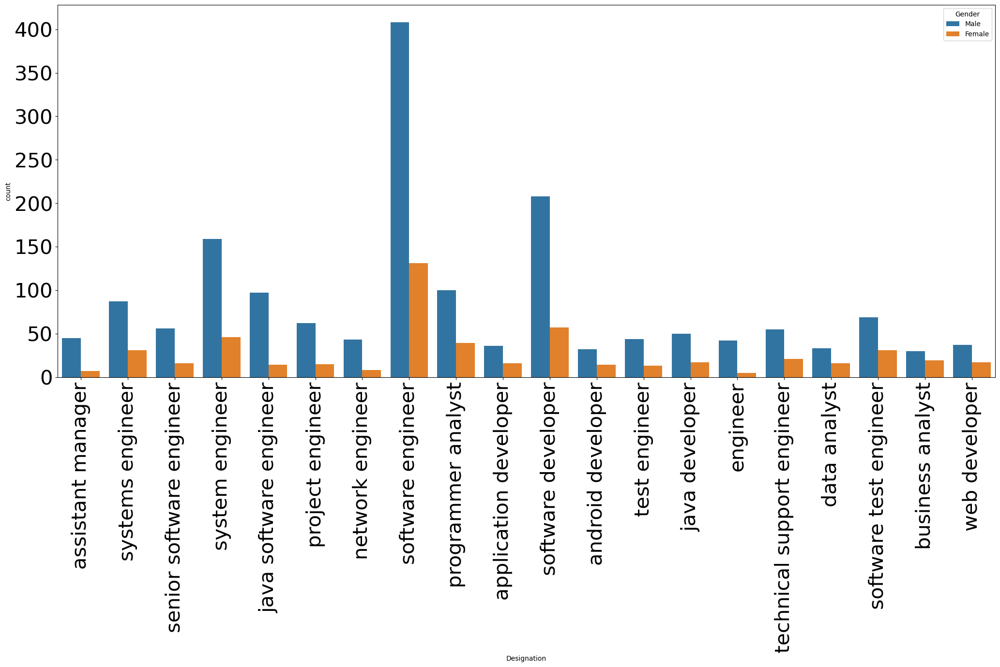

In [120]:
plt.figure(figsize=(25,10))
sns.countplot(x='Designation', hue='Gender',data=top_20_designations)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

* *We observe that Majority of the candidates are Male, many candidates are working as software engineer and software developer
* Majority of the Females are working as Software engineer compared to other roles
* Majority of the candidates are working in software field because,majority of the candidates have done B.Tech from CS and IT Specialization

### Designation vs Salary

In [121]:
# Get the top 20 designations
top_20_designation = df['Designation'].value_counts()[:20].index.tolist()

# Filter the DataFrame to only include the top 20 designations
top_20_designations_df = df[df['Designation'].isin(top_20_designation)]

# Group by the top 20 designations and calculate the average salary
top_20_designations_salary = top_20_designations_df.groupby('Designation')['Salary'].mean().reset_index()

# Rename columns for clarity
top_20_designations_salary.columns = ['Designation', 'Average Salary']

# Display the results
print(top_20_designations_salary)


                   Designation  Average Salary
0            android developer   200760.869565
1        application developer   419038.461538
2            assistant manager   442692.307692
3             business analyst   336428.571429
4                 data analyst   232653.061224
5                     engineer   332340.425532
6               java developer   245000.000000
7       java software engineer   301306.306306
8             network engineer   223921.568627
9           programmer analyst   339784.172662
10            project engineer   312922.077922
11    senior software engineer   544027.777778
12          software developer   258377.358491
13           software engineer   341215.213358
14      software test engineer   337450.000000
15             system engineer   354048.780488
16            systems engineer   369364.406780
17  technical support engineer   239078.947368
18               test engineer   286491.228070
19               web developer   168981.481481


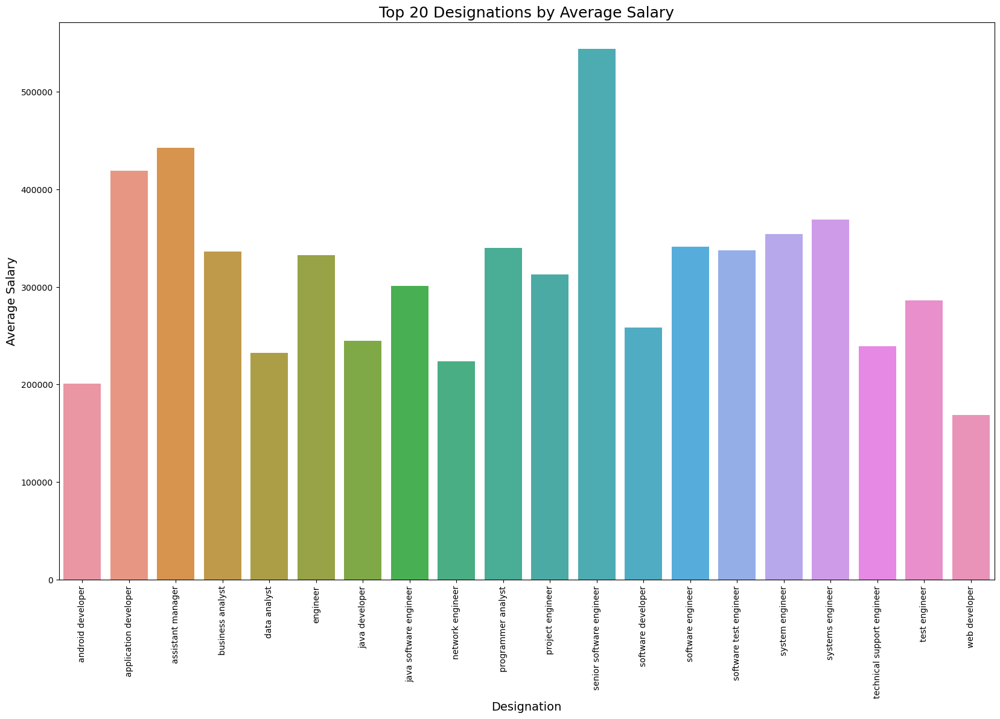

In [122]:


# Plot top 20 designations vs average salary
plt.figure(figsize=(20,12))
sns.barplot(x='Designation', y='Average Salary', data=top_20_designations_salary)
plt.title('Top 20 Designations by Average Salary', fontsize=18)
plt.xlabel('Designation', fontsize=14)
plt.ylabel('Average Salary', fontsize=14)
plt.xticks(rotation=90)
plt.show()


* Senior software engineer has the largest salary more than 5Lakhs

### City vs Salary

In [123]:
#top 15 most frequent cities

top_15_city = df['JobCity'].value_counts()[:15].index.to_list()
top_15_cities = df[df['JobCity'].isin(top_15_city)]

top_15_cities_salary = top_15_cities.groupby('JobCity')['Salary'].mean().reset_index()
top_15_cities_salary.columns= ['City', 'Average Salary']
print(top_15_cities_salary)

             City  Average Salary
0       Bangalore   332801.047120
1     Bhubaneswar   233333.333333
2      Chandigarh   319464.285714
3         Chennai   289345.047923
4           Delhi   271128.318584
5   Greater Noida   264448.275862
6         Gurgaon   333626.126126
7       Hyderabad   307662.162162
8          Jaipur   257641.509434
9         Kolkata   252605.042017
10        Lucknow   216463.414634
11         Mumbai   363235.294118
12         Mysore   291625.000000
13          Noida   298551.282051
14           Pune   330993.883792


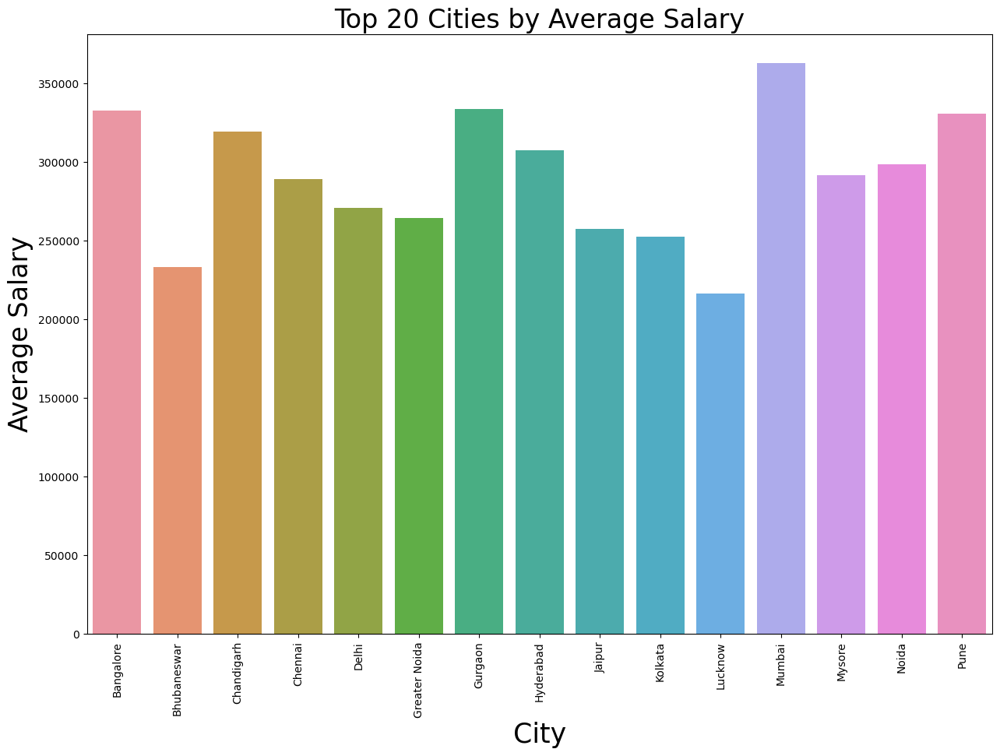

In [124]:
plt.figure(figsize=(15,10))
sns.barplot(x='City', y='Average Salary', data=top_15_cities_salary)
plt.title('Top 20 Cities by Average Salary', fontsize=24)
plt.xlabel('City', fontsize=25)
plt.ylabel('Average Salary', fontsize=24)
plt.xticks(rotation=90)
plt.show()

candidates from Mumbai has the highest average Salary, followed by Banglore,Pune, Gurgaon and Hyderabad

### Specialization vs Salary

In [125]:
top_10_specialization = df['Specialization'].value_counts()[:10].index.to_list()

top_10_specialization_df = df[df['Specialization'].isin(top_10_specialization)]

top_10_spec_salary = top_10_specialization_df.groupby('Specialization')['Salary'].mean().reset_index()

top_10_spec_salary.columns = ['Specialization', 'Average Salary']


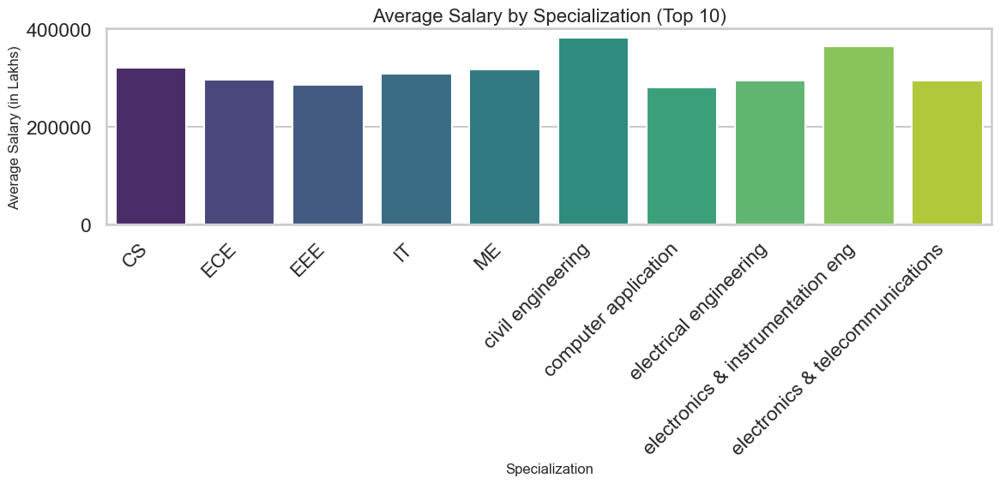

In [126]:
sns.set(style="whitegrid", context="talk")

# Create a figure for the plot
plt.figure(figsize=(12, 6))

# Create the barplot for average salary by specialization
sns.barplot(x='Specialization', y='Average Salary', data=top_10_spec_salary, palette="viridis")

# Set plot labels and title
plt.title('Average Salary by Specialization (Top 10)', fontsize=16)
plt.xlabel('Specialization', fontsize=12)
plt.ylabel('Average Salary (in Lakhs)', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


## Salary vs Numerical Columns

### Salary vs Age

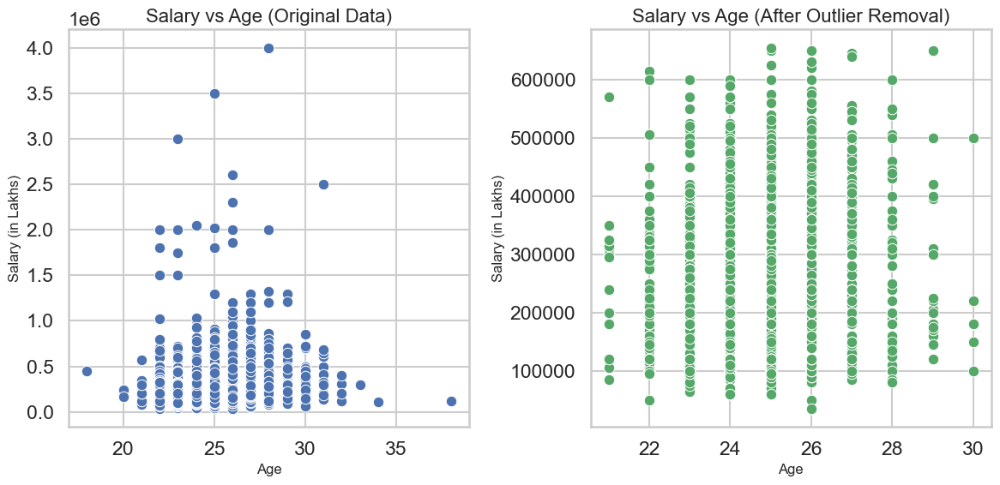

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
plt.figure(figsize=(12, 6))

# Scatter plot for original DataFrame
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
sns.scatterplot(x='Age', y='Salary', data=df, color='b')
plt.title('Salary vs Age (Original Data)', fontsize=16)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Salary (in Lakhs)', fontsize=12)
plt.grid(True)

# Scatter plot for cleaned DataFrame
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
sns.scatterplot(x='Age', y='Salary', data=df_cleaned, color='g')
plt.title('Salary vs Age (After Outlier Removal)', fontsize=16)
plt.xlabel('Age', fontsize=12)
plt.ylabel('Salary (in Lakhs)', fontsize=12)
plt.grid(True)

# Adjust layout and show plots
plt.tight_layout()
plt.show()


* From the scatter plot we see that there are few outliers
* candidates whose age is around 27 years has the highest salary, but we can also observe that candidates of around 22 years has same salary range as candidates older than 27 or 30 years
* which means Age is not related to higher salary which can be confirmed after removing outliers 

### Salary vs Employee Duration

In [128]:
df['EmployeeDuration'].value_counts()

 1.2     214
 0.8     198
 1.0     194
 1.7     171
 1.5     168
        ... 
 10.0      1
 6.0       1
 24.6      1
-0.1       1
 8.5       1
Name: EmployeeDuration, Length: 71, dtype: int64

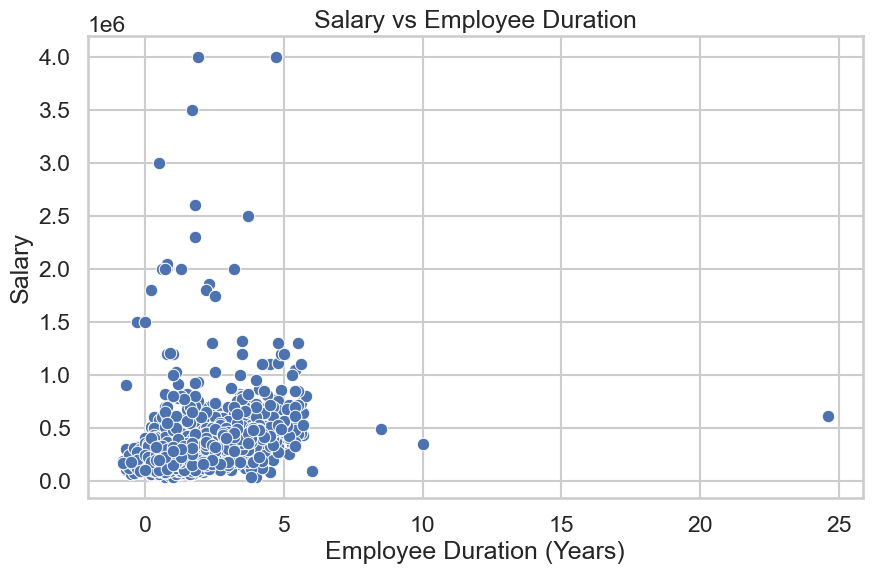

In [129]:
#scatter plot for employee duration vs salary
plt.figure(figsize=(10,6))
sns.scatterplot(x='EmployeeDuration', y='Salary', data=df)
plt.title('Salary vs Employee Duration')
plt.xlabel('Employee Duration (Years)')
plt.ylabel('Salary')
plt.show()


* We observe that many candidates have low salaries.
* long duration in the company does not mean they have higher salary.
* employees having less than 5 years experience also have higher salary but they are very few and are an outlier.



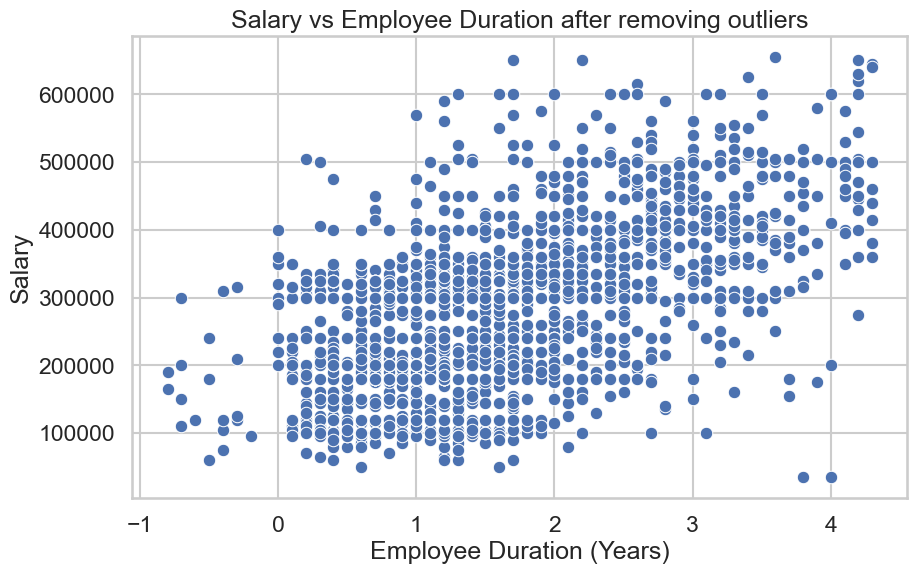

In [130]:
#scatter plot for employee Duration vs salary after removing outliers
plt.figure(figsize=(10,6))
sns.scatterplot(x='EmployeeDuration', y='Salary', data=df_cleaned)
plt.title('Salary vs Employee Duration after removing outliers')
plt.xlabel('Employee Duration (Years)')
plt.ylabel('Salary')
plt.show()

Duration of employees in the company have no much relation with high salary

In [131]:
df.corr()

,ID,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,...,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Age,EmployeeDuration
ID,1.000000,-0.247294,0.044547,0.673102,0.007069,0.035160,0.047144,-0.035977,0.027539,0.135505,...,0.018859,-0.115601,0.482626,0.175557,0.024837,0.120979,-0.146289,0.031359,-0.628784,-0.535367
Salary,-0.247294,1.000000,0.177373,-0.161383,0.170254,-0.179332,0.130103,0.015384,-0.010053,0.178219,...,0.115665,0.000665,-0.100720,-0.064148,0.057423,-0.010213,-0.054685,-0.011312,0.151714,0.385895
10percentage,0.044547,0.177373,1.000000,0.269957,0.643378,-0.126042,0.312538,0.116707,-0.013799,0.350780,...,0.053600,0.085179,-0.018933,0.067657,0.136645,-0.004679,-0.132496,0.036692,-0.243880,0.077948
12graduation,0.673102,-0.161383,0.269957,1.000000,0.259166,0.027691,0.086001,-0.003016,0.014457,0.147925,...,-0.047995,-0.005891,0.293439,0.103329,0.041182,0.061956,-0.074369,-0.015069,-0.872401,-0.445256
12percentage,0.007069,0.170254,0.643378,0.259166,1.000000,-0.100771,0.346137,0.130462,-0.012933,0.212888,...,0.080818,0.117112,-0.043534,0.058299,0.103998,-0.007486,-0.094369,0.006332,-0.265781,0.090531
CollegeTier,0.035160,-0.179332,-0.126042,0.027691,-0.100771,1.000000,-0.086781,-0.101494,-0.005557,-0.183843,...,-0.073644,-0.031573,0.001053,0.055174,-0.038055,0.009970,0.023778,-0.019179,-0.043154,-0.042141
collegeGPA,0.047144,0.130103,0.312538,0.086001,0.346137,-0.086781,1.000000,0.017471,0.008706,0.106478,...,0.136596,0.029855,0.007601,0.069582,0.068282,-0.032684,-0.074859,0.028071,-0.113168,0.063752
CollegeCityTier,-0.035977,0.015384,0.116707,-0.003016,0.130462,-0.101494,0.017471,1.000000,0.008152,0.050462,...,0.064272,0.041083,-0.010643,0.014763,0.005565,-0.008203,0.004442,-0.016790,0.035623,0.034200
GraduationYear,0.027539,-0.010053,-0.013799,0.014457,-0.012933,-0.005557,0.008706,0.008152,1.000000,-0.024089,...,0.026688,0.006179,0.024089,-0.013235,-0.002877,0.008397,-0.000417,0.016855,-0.025639,-0.013696
English,0.135505,0.178219,0.350780,0.147925,0.212888,-0.183843,0.106478,0.050462,-0.024089,1.000000,...,0.125005,0.018591,0.059500,0.034943,0.194990,0.018755,-0.155528,0.067979,-0.101117,0.011817


In [132]:
numerical_cols.columns

Index(['ID', 'Salary', '10percentage', '12graduation', '12percentage',
       'CollegeTier', 'collegeGPA', 'CollegeCityTier', 'GraduationYear',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

### Bivariate Analysis on 10%, 12%, college gpa

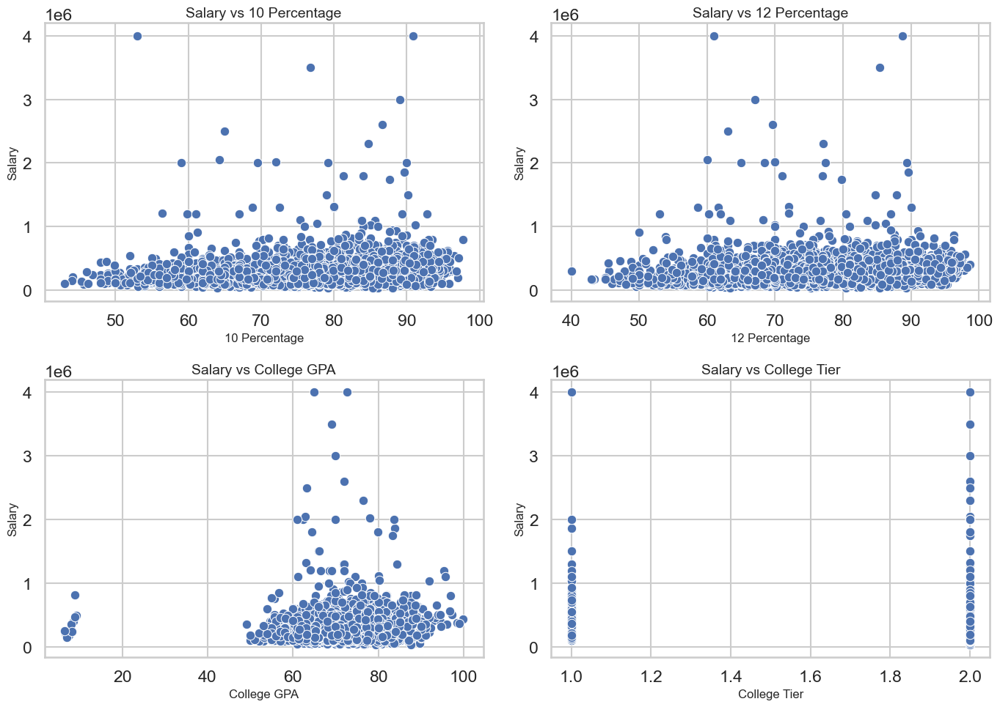

In [133]:

#subplots for 10%, 12%, College GPA
plt.figure(figsize=(14, 10))

# Scatter plot for 10 percentage
plt.subplot(2, 2, 1)
sns.scatterplot(x='10percentage', y='Salary', data=df)
plt.title('Salary vs 10 Percentage', fontsize=14)
plt.xlabel('10 Percentage', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Scatter plot for 12 percentage
plt.subplot(2, 2, 2)  # 2nd subplot
sns.scatterplot(x='12percentage', y='Salary', data=df)
plt.title('Salary vs 12 Percentage', fontsize=14)
plt.xlabel('12 Percentage', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Scatter plot for college GPA
plt.subplot(2, 2, 3)  # 3rd subplot
sns.scatterplot(x='collegeGPA', y='Salary', data=df)
plt.title('Salary vs College GPA', fontsize=14)
plt.xlabel('College GPA', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Scatter plot for College Tier
plt.subplot(2, 2, 4)  # 4th subplot
sns.scatterplot(x='CollegeTier', y='Salary', data=df)
plt.title('Salary vs College Tier', fontsize=14)
plt.xlabel('College Tier', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


* We observe that there is no strong relationship between Salary and 10,12,college GPA or college tier
* That means candidates having high percentage does not mean they will be paid high. 

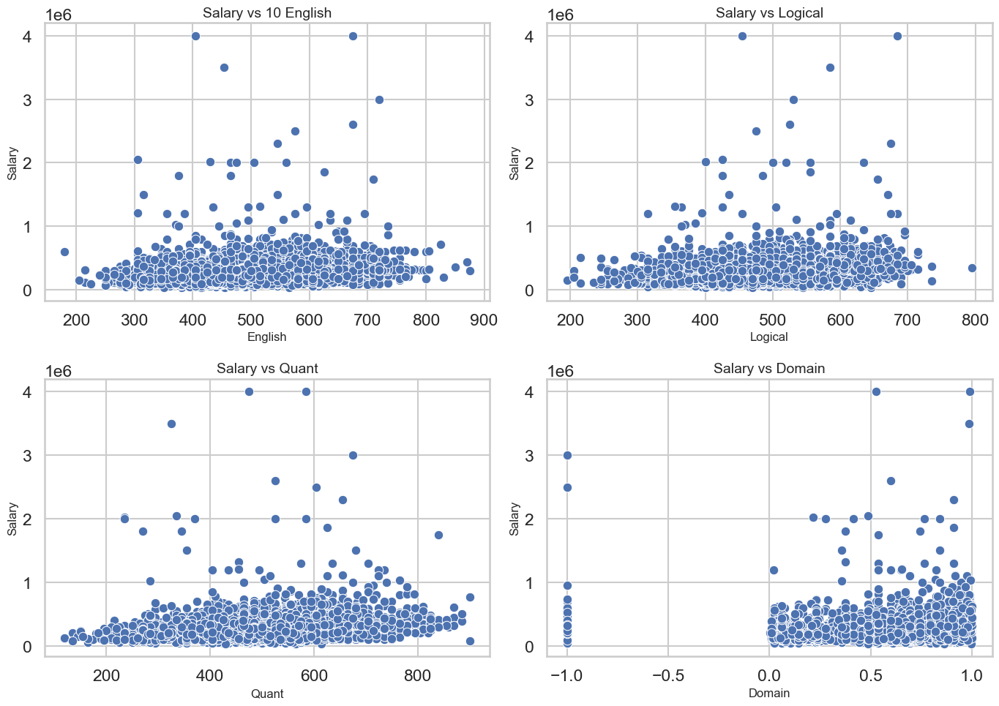

In [134]:
#subplots for 10%, 12%, College GPA
plt.figure(figsize=(14, 10))

# Scatter plot for 10 percentage
plt.subplot(2, 2, 1)
sns.scatterplot(x='English', y='Salary', data=df)
plt.title('Salary vs 10 English', fontsize=14)
plt.xlabel('English', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Scatter plot for 12 percentage
plt.subplot(2, 2, 2)  # 2nd subplot
sns.scatterplot(x='Logical', y='Salary', data=df)
plt.title('Salary vs Logical', fontsize=14)
plt.xlabel('Logical', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Scatter plot for college GPA
plt.subplot(2, 2, 3)  # 3rd subplot
sns.scatterplot(x='Quant', y='Salary', data=df)
plt.title('Salary vs Quant', fontsize=14)
plt.xlabel('Quant', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Scatter plot for College Tier
plt.subplot(2, 2, 4)  # 4th subplot
sns.scatterplot(x='Domain', y='Salary', data=df)
plt.title('Salary vs Domain', fontsize=14)
plt.xlabel('Domain', fontsize=12)
plt.ylabel('Salary', fontsize=12)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

* We can observe that candidates scoring more or less in English, quants or logical have no much relationship with their salaries

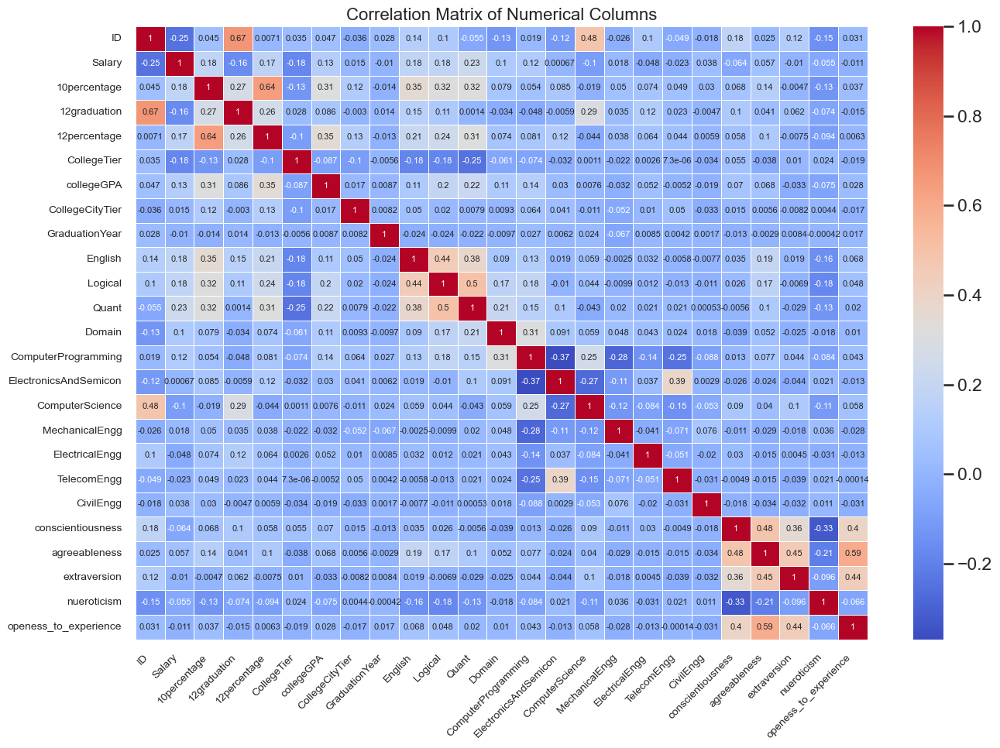

In [135]:

corr_matrix = numerical_cols.corr()
plt.figure(figsize=(14, 10))

# Plot the heatmap with adjusted parameters
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 8})

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.title('Correlation Matrix of Numerical Columns', fontsize=16)

plt.tight_layout()
plt.show()



<Figure size 1400x1000 with 0 Axes>

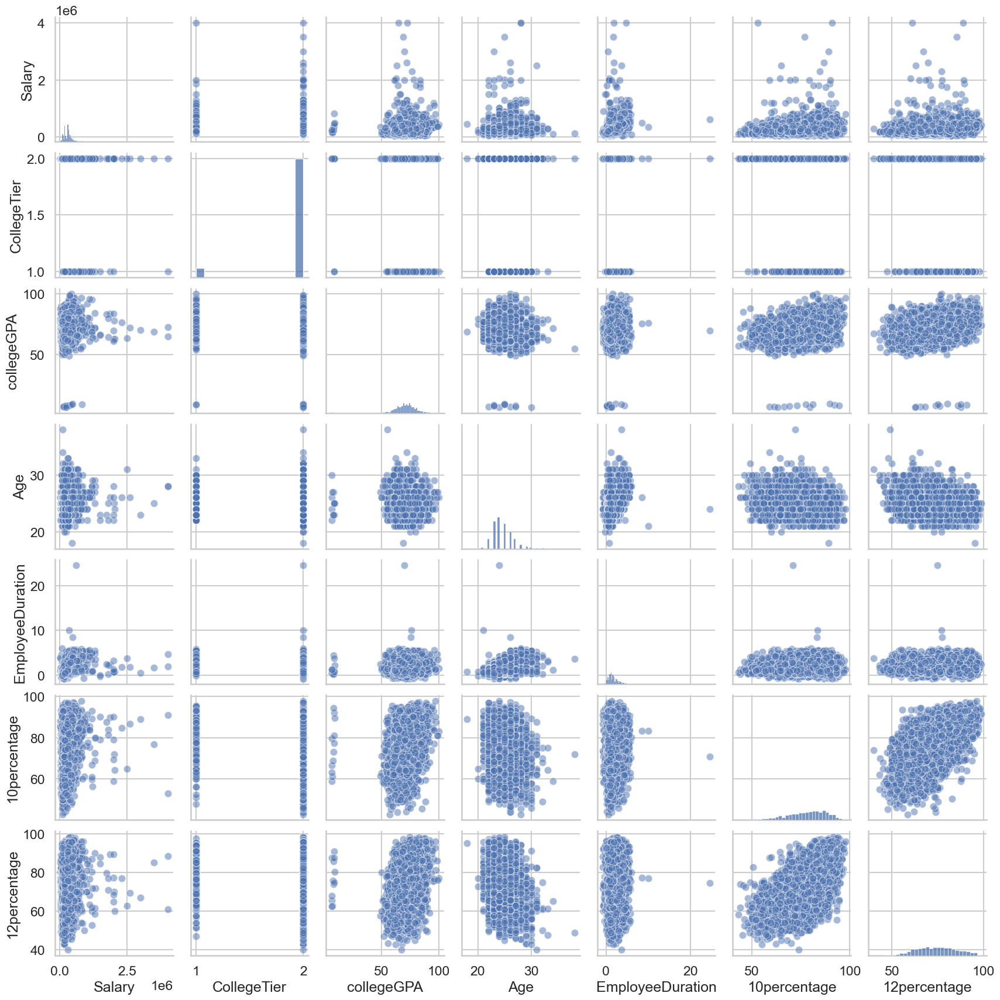

In [136]:
# Use Seaborn's pairplot function for numerical columns
plt.figure(figsize=(14, 10))
sns.pairplot(df[['Salary','CollegeTier','collegeGPA','Age','EmployeeDuration','10percentage','12percentage']],diag_kind='hist', plot_kws={'alpha':0.5})
plt.show()


* college tier has no relationship with salary
* 10percentage has relationship with 12 percentage that means candidates having good 10% will also have good 12%.
* Age obviously will have relationship with employee duration.

<Figure size 1400x1000 with 0 Axes>

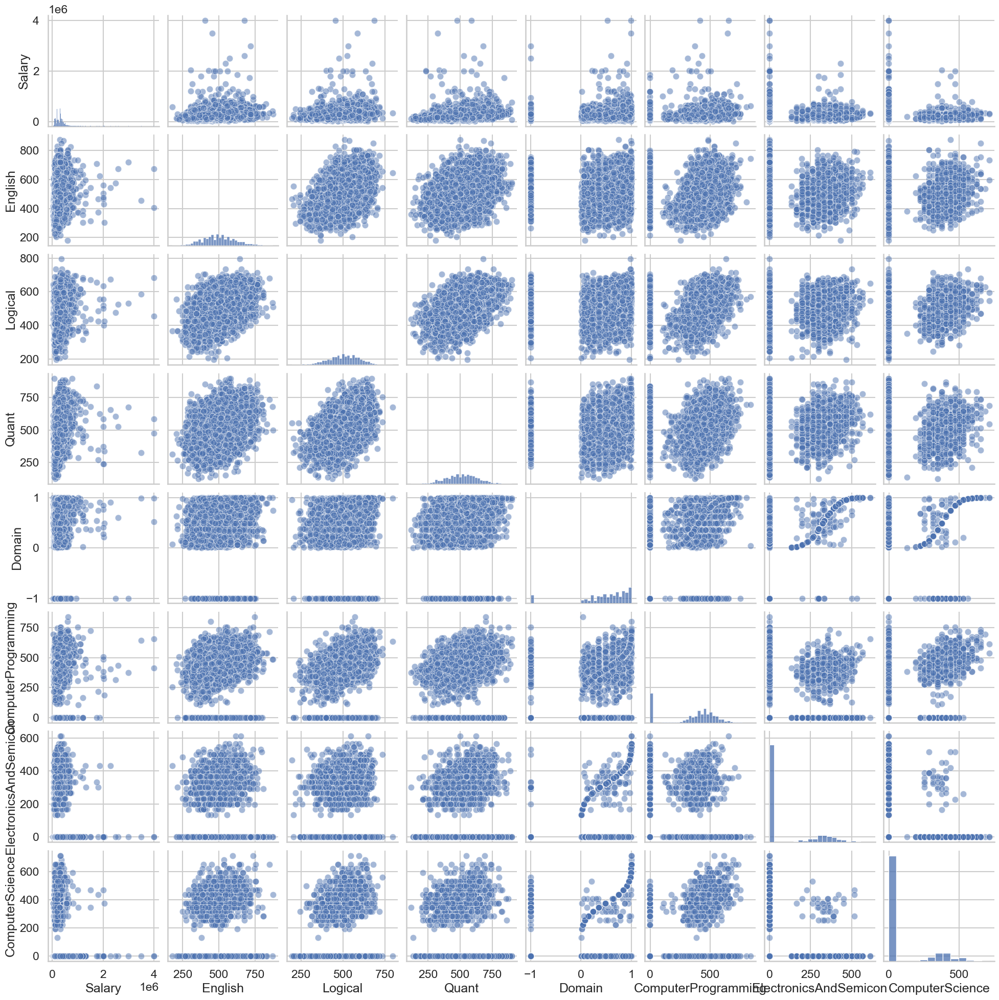

In [137]:
plt.figure(figsize=(14, 10))
sns.pairplot(df[['Salary','English', 'Logical', 'Quant', 'Domain','ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience',]], diag_kind='hist',  plot_kws={'alpha':0.5})
plt.show()

Logical has a strong linear relationship with english,quants,computer science

<Figure size 1400x1000 with 0 Axes>

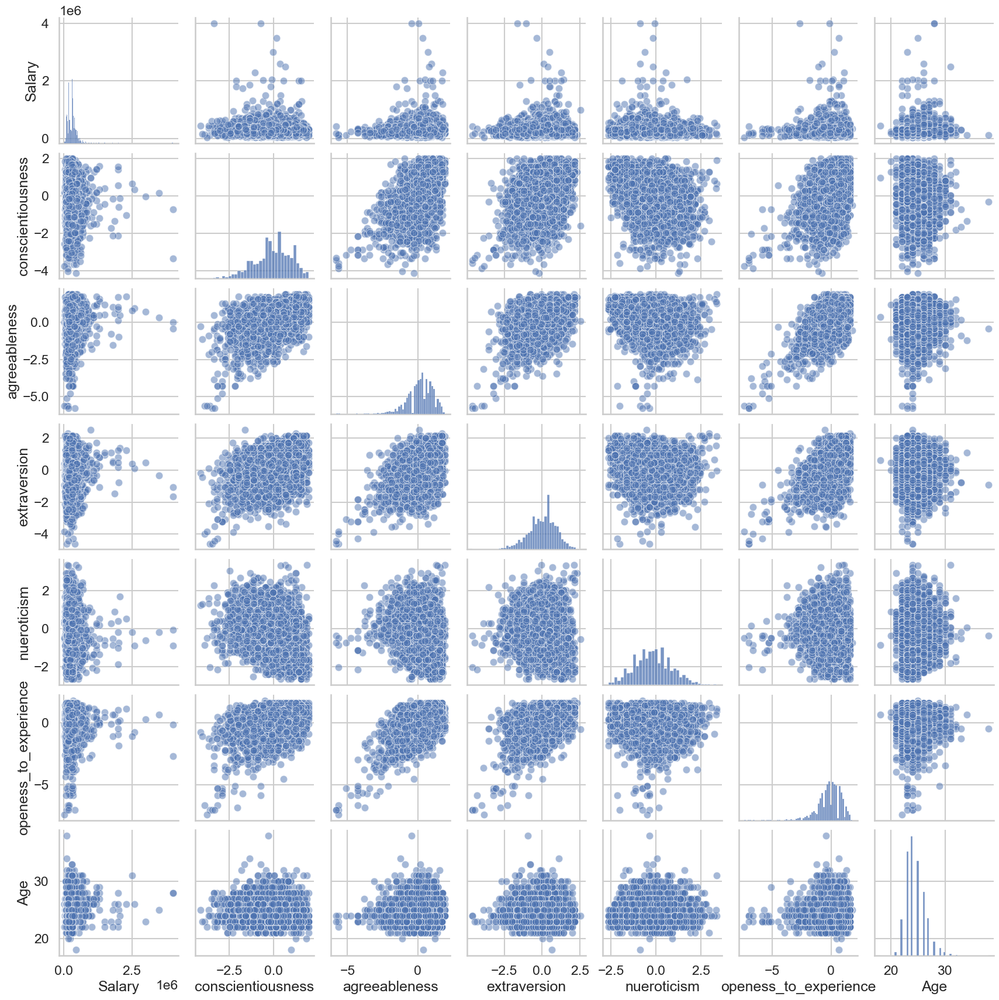

In [138]:
plt.figure(figsize=(14, 10))
sns.pairplot(df[['Salary','conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience',
       'Age',]], diag_kind='hist',  plot_kws={'alpha':0.5})
plt.show()

### Categorical vs Categorical

In [139]:
categorical_cols.columns

Index(['DOL', 'Designation', 'JobCity', 'Gender', '10board', '12board',
       'Degree', 'Specialization', 'CollegeState'],
      dtype='object')

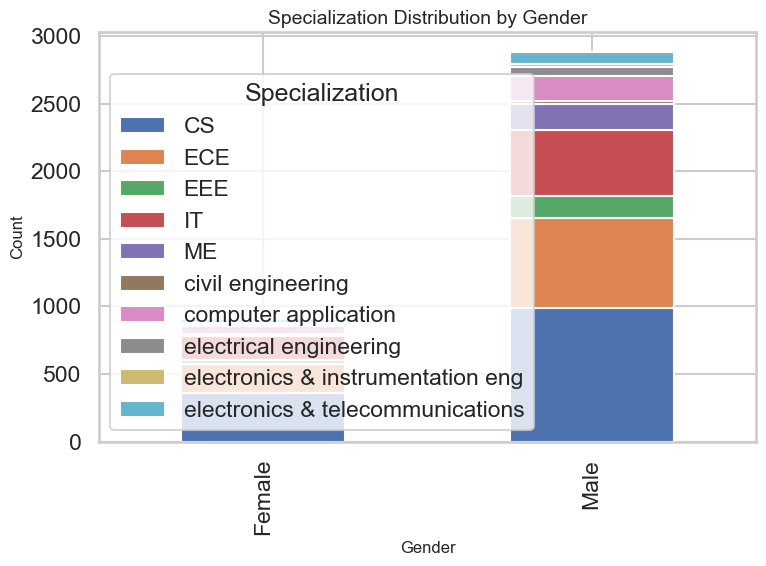

In [142]:

crosstab_gender_specialization = pd.crosstab(df['Gender'], top_10_specialization_df['Specialization'])

# Plot a stacked bar plot
crosstab_gender_specialization.plot(kind='bar', stacked=True, figsize=(8, 6))


plt.title('Specialization Distribution by Gender', fontsize=14)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Specialization')

# Show plot
plt.tight_layout()
plt.show()


Male are more experimental with their career options than females

### Research Question

###### Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.
Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)


In [ ]:
df.columns

In [ ]:
# Clean and format the Designation column
df['Designation'] = df['Designation'].str.strip().str.title()

# Create a dictionary for designation corrections
designation_corrections = {
    'Software Eng': 'Software Engineer',
    'Software Enginner': 'Software Engineer',
    'Software Engg': 'Software Engineer',
    'Software Enginnere': 'Software Engineer',
    'Programmer Analyst': 'Programming Analyst',
    'Programmer Analyst Trainee': 'Programming Analyst'
}

# Replace designations based on the dictionary
df['Designation'] = df['Designation'].replace(designation_corrections)

# Lowercase the Designation column for consistency
df['Designation'] = df['Designation'].str.lower()

# Filter the DataFrame for specific roles and check if employee duration is less than 1 year as it says for fresh graduates
roles = df[(df['Designation'].isin(['programming analyst', 'software engineer', 'hardware engineer', 'associate engineer'])) & (df['EmployeeDuration']<1)]

print(roles.shape) 

In [ ]:
#calculate mean sal
mean_sal_roles = roles['Salary'].mean()
print(mean_sal_roles)

In [ ]:
#check if it falls in range of 2.5 to 3lakhs

if 250000 <= mean_sal_roles <= 300000:
    print("The claim is true")
else:
    print("The claim is false")

`The claim by TOI is true.

### Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)

In [143]:

contingency_table = pd.crosstab(df['Gender'], df['Specialization'], normalize='index') * 100

# Display the contingency table
print("Percentage of Males and Females in Each Specialization:")
print(contingency_table)


Percentage of Males and Females in Each Specialization:
Specialization         CS        ECE       EEE         IT        ME     Other  \
Gender                                                                          
Female          37.513062  22.152560  3.552769  18.077325  1.044932  0.208986   
Male            32.489313  21.966458  5.360079  16.014469  6.280829  0.000000   

Specialization  aeronautical engineering  \
Gender                                     
Female                          0.104493   
Male                            0.065768   

Specialization  applied electronics and instrumentation  \
Gender                                                    
Female                                         0.208986   
Male                                           0.230187   

Specialization  automobile/automotive engineering  biotechnology  ...  \
Gender                                                            ...   
Female                                    0.00000       0.9

<Figure size 1200x800 with 0 Axes>

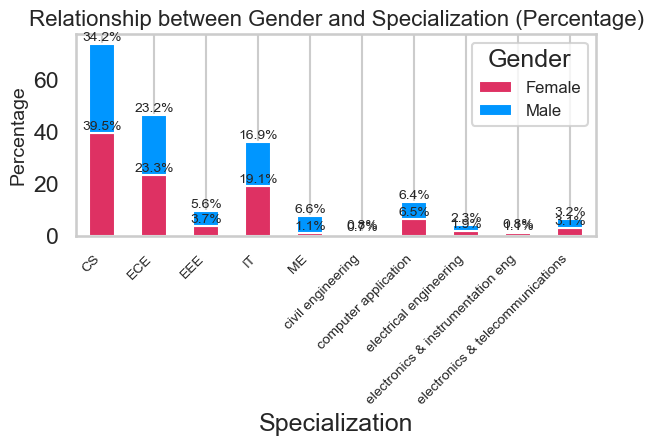

In [144]:

# Create the contingency table with normalized percentages
contingency_table = pd.crosstab(df['Gender'], top_10_specialization_df['Specialization'], normalize='index') * 100
plt.figure(figsize=(12, 8))

# Plot the percentage stacked bar chart with a specific color palette
colors = ['#DE3163', '#0096FF'] 
ax = contingency_table.T.plot(kind='bar', stacked=True, color=colors)

# Adding percentage labels to the stacked bars
for p in ax.patches:
    height = p.get_height()  # Get the height of the bar segment
    width = p.get_width()     # Get the width of the bar segment
    x = p.get_x() + width / 2 # Calculate x position for the label
    y = p.get_y() + height    # Calculate y position for the label
    percentage = f'{height:.1f}%'  # Format percentage to one decimal place
    ax.text(x, y, percentage, ha='center', va='bottom', fontsize=10)  # Add the text label to the plot

# Adding labels and title with larger font size
plt.ylabel('Percentage', fontsize=14)
plt.title('Relationship between Gender and Specialization (Percentage)', fontsize=16)
plt.legend(title='Gender', loc='upper right', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels
plt.grid(axis='y')  # Add gridlines to the y-axis
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


* We observe that Females are high in percentage in CS and IT field.
* Males are high in percentage in Mechanical Engineeering and EEE
* Male and Female are almost equal in ECE, electronics and communication

### Conclusion

1. **Gender Disparities**: The analysis reveals a significant gender imbalance in the engineering workforce, with **males** comprising **76.1%** of the total population. This highlights the need for initiatives to promote gender equality in engineering fields.The majority of employees fall within the **32 to 35 years** age range

2. **Educational Trends**: The majority of graduates hold BTech/BE degrees, while the pursuit of advanced degrees remains low. This trend suggests the need for increased encouragement for further education among graduates.

3. **Salary Insights**: The average salary across the dataset is approximately 3.08 Lakhs,and maximum of 40Lakhs  with Senior Software Engineers earning the highest average salary of over 5 Lakhs.Candidates from **Mumbai** enjoy the highest average salaries, followed closely by those from **Bangalore**, **Pune**, **Gurgaon**, and **Hyderabad**. The validation of the Times of India claim regarding fresh graduates' salaries in programming and software engineering roles confirms the accuracy of current salary trends.

4. **Specialization Choices**: Computer Science, Electronics and Communication Engineering, and Information Technology are the most popular specializations, with **females more prominent in CS and IT**, while **males dominate in Mechanical Engineering and EEE**. This points to the need for targeted efforts to increase female participation in traditionally male-dominated specializations.